# Предобработка данных

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


Загрузим датасет Flickr 30 (изображения):

In [0]:
!wget http://shannon.cs.illinois.edu/DenotationGraph/data/flickr30k-images.tar

--2020-02-19 07:14:35--  http://shannon.cs.illinois.edu/DenotationGraph/data/flickr30k-images.tar
Resolving shannon.cs.illinois.edu (shannon.cs.illinois.edu)... 18.220.149.166
Connecting to shannon.cs.illinois.edu (shannon.cs.illinois.edu)|18.220.149.166|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4440780800 (4.1G) [application/x-tar]
Saving to: ‘flickr30k-images.tar’

flickr30k-images.ta 100%[===================>]   4.14G  41.1MB/s    in 1m 45s  

2020-02-19 07:16:20 (40.3 MB/s) - ‘flickr30k-images.tar’ saved [4440780800/4440780800]



In [0]:
%%time
!tar -xf '/content/flickr30k-images.tar'

CPU times: user 276 ms, sys: 39 ms, total: 315 ms
Wall time: 1min 29s


In [0]:
from torchvision import transforms, datasets
import os
import torch, torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from torch.utils.data import Dataset, DataLoader
import random

Нам потребуется путь к папке с изображениями:

In [0]:
image_dir = '/content/flickr30k-images'

image_transform = transforms.Compose([
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])

## Подготовка captions

В results_new.csv есть список имен файлов картинок и соответствующие им заголовки. Одной картинке соответствует 5 строк из файла. 

In [0]:
results = pd.read_csv("/content/drive/My Drive/Image Captioning/Flickr30/results_new.csv", sep='|', index_col=None)

In [0]:
results.head(15)

,image_name,comment_number,comment
0,1000092795.jpg,0,Two young guys with shaggy hair look at their...
1,1000092795.jpg,1,"Two young , White males are outside near many..."
2,1000092795.jpg,2,Two men in green shirts are standing in a yard .
3,1000092795.jpg,3,A man in a blue shirt standing in a garden .
4,1000092795.jpg,4,Two friends enjoy time spent together .
5,10002456.jpg,0,Several men in hard hats are operating a gian...
6,10002456.jpg,1,Workers look down from up above on a piece of...
7,10002456.jpg,2,Two men working on a machine wearing hard hats .
8,10002456.jpg,3,Four men on top of a tall structure .
9,10002456.jpg,4,Three men on a large rig .


In [0]:
# Переименуем колонки, чтобы убрать пробелы в начале имени
results.columns = ['image_name', 'comment_number', 'comment']

In [0]:
# Приведем строки к нижнему регистру
results.comment = results.comment.str.lower()

Сгруппируем все строки с одной картинкой в одну, объединив все 5 comments в один массив:

In [0]:
results = results.groupby('image_name')['comment'].apply(list).reset_index(name='captions')

In [0]:
results

,image_name,captions
0,1000092795.jpg,[ two young guys with shaggy hair look at thei...
1,10002456.jpg,[ several men in hard hats are operating a gia...
2,1000268201.jpg,[ a child in a pink dress is climbing up a set...
3,1000344755.jpg,[ someone in a blue shirt and hat is standing ...
4,1000366164.jpg,"[ two men , one in a gray shirt , one in a bla..."
...,...,...
31778,997338199.jpg,"[ woman writing on a pad in room with gold , d..."
31779,997722733.jpg,[ a person in a red shirt climbing up a rock f...
31780,997876722.jpg,[ two male construction workers are working on...
31781,99804383.jpg,[ an older busker in glasses plays an eastern ...


In [0]:
results.image_name[0]

'1000092795.jpg'

In [0]:
results.captions[0]

[' two young guys with shaggy hair look at their hands while hanging out in the yard .',
 ' two young , white males are outside near many bushes .',
 ' two men in green shirts are standing in a yard .',
 ' a man in a blue shirt standing in a garden .',
 ' two friends enjoy time spent together .']

In [0]:
len(results)

31783

Разобьем полученный датафрейм на train и val:

In [0]:
seed = 42

random.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)
torch.backends.cudnn.deterministic = True

In [0]:
from sklearn.model_selection import train_test_split

train_set, val_set = train_test_split(results, test_size=1024)

In [0]:
val_set.index = range(len(val_set))

In [0]:
val_set

,image_name,captions
0,3655176735.jpg,[ an older woman appears to read from a childr...
1,7669392800.jpg,[ numerous bicyclists wearing bicyclist appare...
2,4546029322.jpg,[ in this picture we see multiple people cross...
3,120764850.jpg,[ a baby on the floor laughing at an older ano...
4,2912210904.jpg,[ a man loads trees onto a cart on the side of...
...,...,...
1019,6813684611.jpg,[ three people are playing music ; two with vi...
1020,3288203502.jpg,[ redheaded woman holding clear plastic over p...
1021,6221289833.jpg,[ a boy wearing a white and green athletic uni...
1022,241345323.jpg,[ sooners football player number 50 plays in a...


In [0]:
train_set.index = range(len(train_set))

In [0]:
train_set

,image_name,captions
0,2251277216.jpg,[ various people are walking along a path towa...
1,263216826.jpg,[ a man and a woman in an orange shirt are sit...
2,3627929314.jpg,[ a little boy sitting on the ground looking u...
3,3019986034.jpg,[ a woman in a plaid skirt is playing a violin...
4,4508999124.jpg,[ a small boy with a blue and yellow backpack ...
...,...,...
30754,7108301125.jpg,[ several women are playing some sort of sport...
30755,2380519648.jpg,[ a man with a cap and not wearing shirt is la...
30756,128396207.jpg,"[ a bike rider with khaki green shorts , a blu..."
30757,361831875.jpg,[ a person in a green coat looks upwards while...


Посчитаем, сколько раз встречается каждое слово в заголовках для обучения:

In [0]:
from collections import Counter
token_counts = Counter()

for cap in train_set.captions:
    for line in cap:
        token_counts.update(line.split())

In [0]:
token_counts.most_common(10)

[('a', 263031),
 ('.', 146139),
 ('in', 80901),
 ('the', 61002),
 ('on', 44158),
 ('and', 42866),
 ('man', 41190),
 ('is', 39806),
 ('of', 37532),
 ('with', 35041)]

Загрузим предобученные эмбеддинги:

In [0]:
!wget https://dl.fbaipublicfiles.com/fasttext/vectors-english/crawl-300d-2M.vec.zip 

--2020-02-19 07:18:08--  https://dl.fbaipublicfiles.com/fasttext/vectors-english/crawl-300d-2M.vec.zip
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 104.20.6.166, 104.20.22.166, 2606:4700:10::6814:16a6, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|104.20.6.166|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1523785255 (1.4G) [application/zip]
Saving to: ‘crawl-300d-2M.vec.zip’

crawl-300d-2M.vec.z 100%[===================>]   1.42G  26.3MB/s    in 52s     

2020-02-19 07:19:01 (27.8 MB/s) - ‘crawl-300d-2M.vec.zip’ saved [1523785255/1523785255]



In [0]:
!unzip '/content/crawl-300d-2M.vec.zip' 

Archive:  /content/crawl-300d-2M.vec.zip
  inflating: crawl-300d-2M.vec       


In [0]:
import gensim

In [0]:
%%time
w2v_model = gensim.models.KeyedVectors.load_word2vec_format(fname='/content/crawl-300d-2M.vec', binary=False)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


CPU times: user 9min 15s, sys: 8.51 s, total: 9min 24s
Wall time: 9min 22s


Сформируем словарь:

In [0]:
min_count = 5
tokens = [token for token, num in token_counts.items() if (token in w2v_model and num>=min_count)]

Добавим специальные символы:

In [0]:
UNK, PAD, BOS, EOS = "UNK", "PAD", "<bos>", "<eos>"
tokens = [PAD, BOS, EOS, UNK] + tokens

In [0]:
len(tokens)

7628

In [0]:
n_tokens = len(tokens)

Построим словарь для перевода токенов в индексы:

In [0]:
token_to_id = {t:i for i, t in enumerate(tokens)}

In [0]:
UNK_IDX, PAD_IDX = token_to_id["UNK"], token_to_id["PAD"]
BOS_IDX, EOS_IDX = token_to_id["<bos>"], token_to_id["<eos>"]

Соберем эмбеддинги слов из нашего словаря в одну матрицу:

In [0]:
numpy_embeddings = np.zeros(shape=[len(tokens), 300],dtype=np.float32)

for word in tokens:
    if word in w2v_model:
        vector = w2v_model.get_vector(word)
        index  = token_to_id[word]
        numpy_embeddings[index] = vector
        
pretrained_embeddings = torch.FloatTensor(numpy_embeddings)
pretrained_embeddings.shape

torch.Size([7628, 300])

## Формирование датасетов для обучения и валидации

In [0]:
# Преобразуем список токенов в матрицу индексов с паддингами
def as_matrix(sequences, max_len=None):
    """ 
    Convert a list of tokens into a matrix with padding 
    params:
        sequences: list of sentences. Each sentence is a tokenized string or list of tokens
        max_len: if specified, 
    """
    # print(sequences)
    if isinstance(sequences[0], str):
        sequences = list(map(str.split, sequences))
    # print(sequences)    
    max_len = min(max(map(len, sequences)), max_len or float('inf'))
    
    matrix = np.full((len(sequences), max_len+2), np.int32(PAD_IDX))
    for i,seq in enumerate(sequences):
        row_ix = [BOS_IDX] + [token_to_id.get(word, UNK_IDX) for word in seq[:max_len]] + [EOS_IDX]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [0]:
# batch generator
from random import choice

def generate_batch(dataset, batch_size, max_caption_len=None):
    
    #sample random numbers for image/caption indicies
    random_index = np.random.randint(0, len(dataset), size=batch_size)
    
    batch_images, batch_captions = None, []

    for ind in random_index:

        image, captions = dataset[ind]

        if batch_images is None:
            batch_images = image.unsqueeze(0)
        else:
            batch_images = torch.cat((batch_images, image.unsqueeze(0)), 0)
        
        #pick one from a set of captions for each image
        caption = choice(captions)

        batch_captions.append(caption)

    batch_captions = as_matrix(batch_captions, max_caption_len)
    
    return batch_images, torch.tensor(batch_captions, dtype=torch.int64)
    

In [0]:
class FlickrDataset(Dataset):
    """Flickr30 dataset."""

    def __init__(self, data_frame, root_dir, image_transform):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.data_frame = data_frame 
        self.root_dir = root_dir
        self.image_transform = image_transform

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        
        image_name = os.path.join(self.root_dir,
                                  self.data_frame.image_name[idx])
        image = plt.imread(image_name)
        # Меняем размер иображений и приводим к интервалу от 0 до 1
        image = np.array(Image.fromarray(image).resize((256, 256))).astype('float32') / 255.
        # Переставляем каналы на первое место
        image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
        # Нормализуем
        if self.image_transform is not None:
            image = self.image_transform(image)

        captions = self.data_frame.captions[idx]

        return image, captions

    def show_sample(self, idx):

        image_name = os.path.join(self.root_dir,
                                  self.data_frame.image_name[idx])
        image = plt.imread(image_name)
        image = np.array(Image.fromarray(image).resize((299, 299))).astype('float32') / 255.

        captions = self.data_frame.captions[idx]
        captions = np.array(captions)

        plt.imshow(image)
        print(captions)

### Train dataset

In [0]:
train_dataset = FlickrDataset(train_set, image_dir, image_transform)

In [0]:
len(train_dataset)

30759

[' various people are walking along a path towards a fenced-in area that is surrounded by small buildings .'
 ' people running on a sidewalk in the middle of a grassy area .'
 ' people running and walking in and out of a small farm town .'
 ' several couples running down the road to a farm house .'
 ' a woman runs along the sidewalk .']


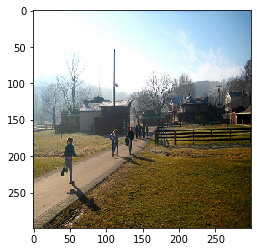

In [0]:
train_dataset.show_sample(0)

[' crowded street with a man holding a subway sign pointing customers to a subway sandwich shop .'
 ' a man dressed in blue , holding a subway sandwich sign on the sidewalk .'
 ' a man in a blue shirt and blue jeans standing behind a subway sign .'
 ' a man in all bright blue against a subway sign in new york city .'
 ' man holding a sign promoting subway restaurant .']


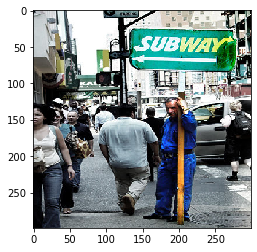

In [0]:
train_dataset.show_sample(12345)

Протестируем генерацию батча:

In [0]:
# max_caption_len без учета спец символов для начала и конца предложения
batch = generate_batch(train_dataset, 3, max_caption_len=10)

In [0]:
batch[1]

tensor([[   1,    9,  412,    5,   45,   35,   29, 1611,   22,    9,  409,    2],
        [   1,  180,   15,   42,  515,  421,   56,  422,   27, 1201,  208,    2],
        [   1,   25,  249,   15,   87, 2255, 2857,   56,  619,  106,   24,    2]])

In [0]:
batch[0].shape, batch[1].shape

(torch.Size([3, 3, 256, 256]), torch.Size([3, 12]))

In [0]:
batch = generate_batch(train_dataset, 3)

In [0]:
batch[1]

tensor([[   1,    9,   63,  122,   98,    9, 4665,  137,  251,   30,  208,   25,
           91,   63,  122,   37,  807,   20,    2,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
        [   1,    9,   41,   24,    9,  139,  110,   48, 4945,   76,   48,   25,
          303,  203,    9,  155,   27,  133, 1525,   20,    2,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
        [   1,   61,  108,   68,   87,  100,  170,   56,    9,   94,  111,   29,
           94,   29,  520,  116,   87,    9, 3843,  112,   25,   91,   74,    9,
         2489,   29,    9, 7556, 1645,   44,   87,    9, 2447,   20,    2]])

In [0]:
batch[0].shape, batch[1].shape

(torch.Size([3, 3, 256, 256]), torch.Size([3, 35]))

### Validation dataset

In [0]:
# Переводит массив индексов в строку/массив с токенами (до первого символа конца строки)
def translate(list_ind, to_str=True):
  
  if EOS_IDX in list_ind:
    max_ind = list_ind.index(EOS_IDX)
  else:
    max_ind = len(list_ind)

  if to_str:
    return (' ').join([tokens[ind] for ind in list_ind[:max_ind]])
  else:
    return [tokens[ind] for ind in list_ind[:max_ind]]

In [0]:
import nltk
from nltk.translate.bleu_score import corpus_bleu

In [0]:
val_dataset = FlickrDataset(val_set, image_dir, image_transform)

In [0]:
len(val_dataset)

1024

Этот пример будем использовать в процессе обучения в качестве fixed example, чтобы наблюдать за качеством модели:

[' swimming instructors teaching young girls how to float in a pool .'
 ' man in black swimsuit plays in pool with three young children .'
 ' two men in wetsuits supervise children as they learn to swim .'
 ' swimming instructors show young girls how to float .'
 ' a group of children learning to swim .']


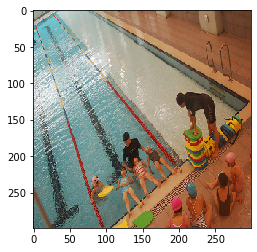

In [0]:
# Fixed example
val_dataset.show_sample(992)

In [0]:
batch_size_val = 32

In [0]:
val_size = len(val_dataset) // batch_size_val * batch_size_val

In [0]:
val_size

1024

In [0]:
# Для расчета bleu
references = []
for cap in val_set.captions[:val_size]:
  new_cap = []
  for str_cap in cap:
    new_cap.append(list(str_cap.split()))
  references.append(new_cap)

In [0]:
references[0]

[['an',
  'older',
  'woman',
  'appears',
  'to',
  'read',
  'from',
  'a',
  'children',
  "'s",
  'book',
  'in',
  'an',
  'indoor',
  'setting',
  ',',
  'while',
  'a',
  'seated',
  'gentleman',
  'in',
  'a',
  'service',
  'uniform',
  'looks',
  'on',
  '.'],
 ['a',
  'woman',
  'with',
  'short',
  'black',
  'hair',
  'and',
  'a',
  'colorful',
  'necklace',
  'reads',
  'a',
  'children',
  "'s",
  'illustration',
  'book',
  '.'],
 ['a',
  'woman',
  'with',
  'a',
  'white',
  'shirt',
  'holding',
  'a',
  'children',
  'book',
  '.'],
 ['a', 'woman', 'reading', 'a', 'children', "'s", 'book', '.'],
 ['a', 'lady', 'reading', 'a', 'story', 'book', '.']]

In [0]:
# batch generator
def generate_batch_val(dataset, indx, batch_size, max_caption_len=None):
    
    batch_images, batch_captions = None, []

    for ind in range(indx, indx+batch_size):

        image, captions = dataset[ind]

        if batch_images is None:
            batch_images = image.unsqueeze(0)
        else:
            batch_images = torch.cat((batch_images, image.unsqueeze(0)), 0)

        caption = choice(captions)

        batch_captions.append(caption)

    batch_captions = as_matrix(batch_captions, max_caption_len)
    
    return batch_images, torch.tensor(batch_captions, dtype=torch.int64)
    

In [0]:
def evaluate(model, criterion, max_len=None, val_size=len(val_dataset), batch_size=batch_size_val):
    
    model.eval()
    
    epoch_loss = 0
    bleu = 0
    hypotheses = []

    # Не учитываем последний неполный батч
    val_size = val_size // batch_size * batch_size

    random_ind = random.randint(0, val_size-1)
    
    with torch.no_grad():
    
        for i in range(0, val_size, batch_size):

            image_vectors, captions_ix = generate_batch_val(val_dataset, i, batch_size) 
            
            image_vectors, captions_ix = image_vectors.to(device), captions_ix.to(device)

            captions_ix_next = captions_ix[:, 1:].contiguous()
        
            outputs, atts = network(image_vectors, captions_ix, teacher_forcing_ratio=0.)

            loss = criterion(outputs.contiguous().view(-1, outputs.shape[-1]), captions_ix_next.view(-1))
            
            epoch_loss += loss.item()

            outputs_max = outputs.argmax(-1)
            for out in outputs_max:
              hypotheses.append(translate(out.tolist(), to_str=False))

            if random_ind in range(i,i+batch_size):
              print('Random example:')
              print('\tTarget: {}'.format(translate(captions_ix_next[random_ind % batch_size].tolist())))
              print('\tOutput: {}'.format(translate(outputs.argmax(-1)[random_ind % batch_size].tolist())))

    print('Fixed example :')
    print('\tTarget: {}'.format(translate(captions_ix_next[0].tolist())))
    print('\tOutput: {}'.format(translate(outputs.argmax(-1)[0].tolist())))

    bleu = corpus_bleu(references, hypotheses)
        
    return epoch_loss / (val_size // batch_size), bleu*100

# Посторение нейросети

##Encoder

В качестве энкодера используем Resnext 101 32x8d.

In [0]:
class Encoder(nn.Module):
    """
    Encoder.
    """

    def __init__(self):
        super(Encoder, self).__init__()

        resnext = models.resnext101_32x8d(pretrained=True) 

        # Удаляем пулинг и последний линейный слой
        # На выходе будем получать тензор (batch_size, 2048, 8, 8)
        modules = list(resnext.children())[:-2]
        self.resnext = nn.Sequential(*modules)

        # Добавляем свой пулинг для получения вектора (batch_size, 2048)
        self.adaptive_pool = nn.AdaptiveAvgPool2d(1)

        self.fine_tune()

    def forward(self, images):
        """
        Forward propagation.
        :param images: images, a tensor of dimensions (batch_size, 3, image_size, image_size)
        :return: encoded images
        """
        # (batch_size, 2048, 8, 8)
        out = self.resnext(images)

        # (batch_size, 2048, 1, 1)  
        out_lin = self.adaptive_pool(out)

        # (batch_size, 2048)
        out_lin = out_lin.squeeze(2).squeeze(2)

        return out, out_lin

    def fine_tune(self, fine_tune=False):
        """
        Allow or prevent the computation of gradients for convolutional blocks 2 through 4 of the encoder.
        :param fine_tune: Allow?
        """
        for p in self.resnext.parameters():
            p.requires_grad = False

##Decoder + Attention

In [0]:
class Attention(nn.Module):
    def __init__(self, cnn_feature_size, hid_dim): 
        
        super(Attention, self).__init__()
        self.method = method
        self.hid_dim = hid_dim
        self.cnn_feature_size = cnn_feature_size

        self.fc_1 = nn.Linear(self.cnn_feature_size, self.hid_dim)
        self.fc_2 = nn.Linear(self.hid_dim, self.hid_dim)
        self.fc_3 = nn.Linear(self.hid_dim, 1)
       
    def forward(self, encoder_output, output, seq_len=None):

        # INPUT
        # encoder_output : (batch_size x num_pixels x cnn_feature_size)
        # output : (batch_size x hidden_dim)
        #
        # OUTPUT
        # att_weight : (batch_size x num_pixels)
        # att : (batch_size x cnn_feature_size)

        # (batch_size x num_pixels x cnn_feature_size) -> (batch_size x num_pixels x hidden_dim)
        x = self.fc_1(encoder_output)
        # (batch_size x hidden_dim) -> (batch_size x 1 x hidden_dim)
        y = self.fc_2(output).unsqueeze(1)

        # (batch_size x num_pixels x hidden_dim) + (batch_size x 1 x hidden_dim) = (batch_size x num_pixels x hidden_dim) -> (batch_size x num_pixels)
        att_weight = torch.nn.functional.softmax(self.fc_3(torch.relu(x + y)).squeeze(2), dim=-1)
        # (batch_size x num_pixels x cnn_feature_size) * (batch_size x num_pixels x 1) -> (batch_size x cnn_feature_size)
        att = (encoder_output * att_weight.unsqueeze(2)).sum(dim=1)

        return att, att_weight

In [0]:
class Decoder(nn.Module):
    def __init__(self, attention, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_feature_size=2048, num_layers=1):
        super(self.__class__, self).__init__()
        
        self.n_tokens = n_tokens

        self.attention = attention

        self.fc_1 = nn.Linear(lstm_units, cnn_feature_size)

        # create embedding for input words
        self.embed = nn.Embedding.from_pretrained(pretrained_embeddings, freeze=True, padding_idx=PAD_IDX) 
        self.drop = nn.Dropout(0.4) 
            
        # lstm
        self.lstm = nn.LSTMCell(emb_size + cnn_feature_size, lstm_units, bias=True) 

        self.drop_2 = nn.Dropout(0.1) 

        # линейный слой для получения логитов
        self.fc_2 = nn.Linear(lstm_units, n_tokens)

        self.init_weights()
        
    def forward(self, captions, encoder_outputs, hidden=None, cell=None, teacher_forcing_ratio=1.):

        # (batch_size)
        captions = captions 
        
        # embedded : (batch_size x emb_dim)
        embedded = self.embed(captions) 
        embedded = self.drop(embedded)

        # (batch_size x cnn_feature_size), (batch_size x num_pixels)
        att, att_weigths = self.attention(encoder_outputs, hidden)
        # (batch_size x hidden_dim) -> (batch_size x cnn_feature_size)
        gate = torch.sigmoid(self.fc_1(hidden))
        # (batch_size x cnn_feature_size) * (batch_size x cnn_feature_size) = (batch_size x cnn_feature_size)
        att = gate * att

        # (batch_size x (emb_dim + cnn_feature_size))
        lstm_in = torch.cat([embedded, att], dim=1)
        # hidden : (batch_size x hidden_dim)        
        hidden, cell = self.lstm(lstm_in, (hidden, cell))

        prediction = self.fc_2(self.drop_2(hidden)) 

        # Дополнительно будем возвращать attention
        return prediction, hidden, cell, att_weigths

    def init_weights(self):
        """
        Initializes some parameters with values from the uniform distribution, for easier convergence.
        """
        self.fc_2.bias.data.fill_(0)
        self.fc_2.weight.data.uniform_(-0.08, 0.08)       

##Model

In [0]:
class CaptionNet(nn.Module):
    def __init__(self, encoder, decoder, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_feature_size=2048, num_layers=1):
        super(self.__class__, self).__init__()
        
        self.n_tokens = n_tokens
        self.cnn_feature_size = cnn_feature_size

        # два линейных слоя, которые будут из векторов, полученных на выходе Inseption, 
        # получать начальные состояния h0 и c0 LSTM-ки, которую мы потом будем 
        # разворачивать во времени и генерить ею текст
        self.cnn_to_h0 = nn.Linear(cnn_feature_size, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_feature_size, lstm_units)

        self.encoder = encoder
        self.decoder = decoder
        
    def forward(self, image_vectors, captions_ix=None, teacher_forcing_ratio=1.):
        """ 
        Apply the network in training mode. 
        :param image_vectors: torch tensor, содержаший выходы inseption. Те, из которых будем генерить текст
                shape: [batch_size, 3, 256, 256]
        :param captions_ix: [batch_size, max_len]
                таргет описания картинок в виде матрицы
        :returns: логиты для сгенерированного текста описания, shape: [batch_size, max_len, n_tokens]
        """
        batch_size = image_vectors.shape[0] 

        # (batch_size x 2048 x 8 x 8), (batch_size x 2048)
        image_att, image_emb = self.encoder(image_vectors)

        # Переставляем каналы на последнее место перед подачей в lstm
        # (batch_size x 2048 x 8 x 8) -> (batch_size x 8 x 8 x 2048) -> (batch_size x 64 x 2048)
        image_att = image_att.permute(0, 2, 3, 1).view(batch_size, -1, self.cnn_feature_size)
        num_pixels = image_att.shape[1]

        if captions_ix is None:
          max_len = 30
        else:
          max_len = captions_ix.shape[1]      
        
        # tensor to store decoder outputs
        outputs = torch.zeros(batch_size, max_len, self.n_tokens).to(device)
        attentions = torch.zeros(batch_size, max_len, num_pixels).to(device)

        cell = torch.sigmoid(self.cnn_to_c0(image_emb)) 
        hidden = torch.sigmoid(self.cnn_to_h0(image_emb))  
        
        # first input to the decoder is the <bos> tokens
        captions_input = torch.full((batch_size,), np.int32(BOS_IDX), dtype=torch.int64).to(device) 
        
        for t in range(1, max_len):

            lstm_outputs, hidden, cell, att = self.decoder(captions_input, image_att, hidden, cell)

            outputs[:, t, :] = lstm_outputs
            attentions[:, t, :] = att

            teacher_force = random.random() < teacher_forcing_ratio

            if teacher_force:
              captions_input = captions_ix[:, t] 
            else:
              captions_input = lstm_outputs.argmax(-1) 
        
        return outputs[:, 1:], attentions[:, 1:]

    def sample(self, image_vectors, max_len=None, sample=True, st=1):
        
        if max_len is None:
            # Согласно гистограмме длин подавляющее большинство подписей имеет длину, не превосходящую 35
            max_len = 35

        batch_size = image_vectors.shape[0]

        # Генерируем подпись для одного изображения
        assert batch_size == 1

        image_att, image_emb = self.encoder(image_vectors)

        image_att = image_att.permute(0, 2, 3, 1).view(batch_size, -1, self.cnn_feature_size)
        num_pixels = image_att.shape[1]      
        
        # tensor to store decoder outputs
        sentence = []
        attentions = np.zeros((max_len, num_pixels)) 

        # Инициализируем h и c для слоя lstm
        cell = torch.sigmoid(self.cnn_to_c0(image_emb)) 
        hidden = torch.sigmoid(self.cnn_to_h0(image_emb))  
        
        # Первый раз на вход декодеру подаем символ начала строки <bos>
        captions_input = torch.full((batch_size,), np.int32(BOS_IDX), dtype=torch.int64).to(device)  
        
        for t in range(1, max_len):

            lstm_outputs, hidden, cell, att = self.decoder(captions_input, image_att, hidden, cell)

            attentions[t, :] = att.squeeze(0).data.cpu().numpy() 

            if sample:
                # Выбираем токен согласно полученному распределению вероятностей
                next_word_probs = F.softmax(lstm_outputs[0], dim=-1).data.cpu().numpy()
                next_word_probs = next_word_probs ** st / np.sum(next_word_probs ** st)
                next_word = np.random.choice(tokens, p=next_word_probs)
            else:
                # Берем токен с максимальной вероятностью
                next_word = tokens[lstm_outputs[0].data.cpu().numpy().argmax(-1)]

            if next_word == EOS:
                break

            sentence.append(next_word)

            captions_input[0] = token_to_id[next_word]
        
        return (' ').join(sentence), attentions[1:]       

# Training

In [0]:
seed = 42

random.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)
torch.backends.cudnn.deterministic = True

In [0]:
att_nn = Attention(2048, 512)
enc_nn = Encoder()
dec_nn = Decoder(att_nn, n_tokens, 300, 512, 2048, 1)
network = CaptionNet(enc_nn, dec_nn, n_tokens, 300, 512, 2048, 1)

Downloading: "https://download.pytorch.org/models/resnext101_32x8d-8ba56ff5.pth" to /root/.cache/torch/checkpoints/resnext101_32x8d-8ba56ff5.pth


In [0]:
optimizer = torch.optim.Adam(network.parameters(), lr = 0.0005)
criterion = nn.CrossEntropyLoss(ignore_index = PAD_IDX)

In [0]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [0]:
network = network.to(device)

In [0]:
max_epochs = 30000
batch_size = 32
every_epochs = 300
clip = 5

In [0]:
pytorch_total_params = sum(p.numel() for p in network.parameters() if p.requires_grad)
pytorch_total_params

14235597

In [0]:
pytorch_total_params = sum(p.numel() for p in network.parameters())
pytorch_total_params

103266333

In [0]:
def plot_loss():

    plt.figure(figsize=(12,4))

    plt.subplot(1,2,2)
    plt.title("Losses")
    plt.plot(train_losses, label="train loss")
    plt.plot(val_losses, label="val loss")
    plt.plot(np.argmin(val_losses), np.min(val_losses), marker="x", color="r", label="best val loss")
    plt.xlabel("Epochs")
    plt.ylabel("Losses")
    plt.legend()

    plt.subplot(1,2,1)
    plt.title("BLEU")
    plt.plot(bleu, label="val bleu")
    plt.plot(np.argmax(bleu), np.max(bleu), marker="x", color="b", label="best bleu")
    plt.xlabel("Epochs")
    plt.ylabel("BLEU")
    plt.legend()

    plt.show()

Epoch : 300
Train example :
	Target: a dog runs holding a yellow dog toy in fall , bench in the background .
	Output: a dog is a a a shirt . . a the . . a the .
Random example:
	Target: a street performer playing banjo on a city street .
	Output: a man in a black shirt is sitting on a street .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a red shirt is in a of of a .
Train loss    : 4.975757206281026
Val loss      : 5.435137778520584
Val bleu      : 9.40323508056693



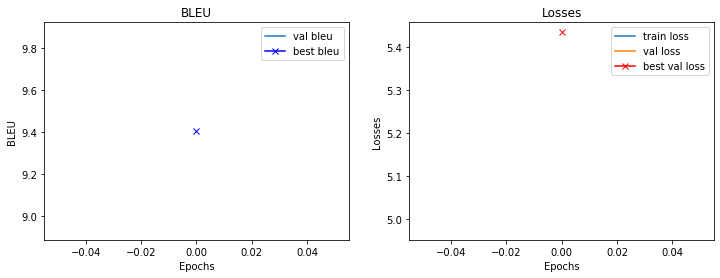

Epoch : 600
Train example :
	Target: a woman with blond-hair pulled in a ponytail steps out of an orange helicopter .
	Output: a man in a and a a blue and . a a street . .
Random example:
	Target: three teenagers laying in a field and socializing with each other .
	Output: a young boy in a red shirt and a red shirt and a red shirt is playing on a field .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is in a blue shirt is standing in a pool .
Train loss    : 4.222017765839895
Val loss      : 5.671426996588707
Val bleu      : 7.74437656270295



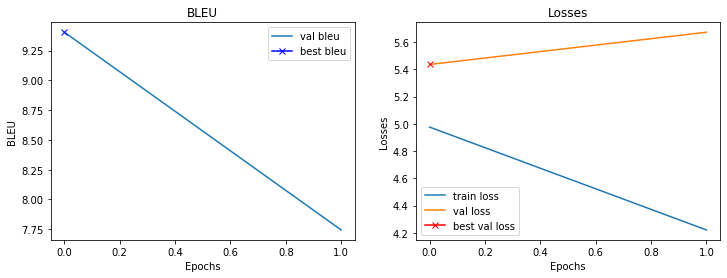

Epoch : 900
Train example :
	Target: a man with glasses playing a silver guitar .
	Output: a man playing a playing guitar . guitar .
Random example:
	Target: a man climbs up an artificial climbing wall .
	Output: a man in a blue shirt is sitting on a beach .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is a a blue shirt is standing in a pool .
Train loss    : 3.974581799507141
Val loss      : 5.769333630800247
Val bleu      : 15.257628247545293



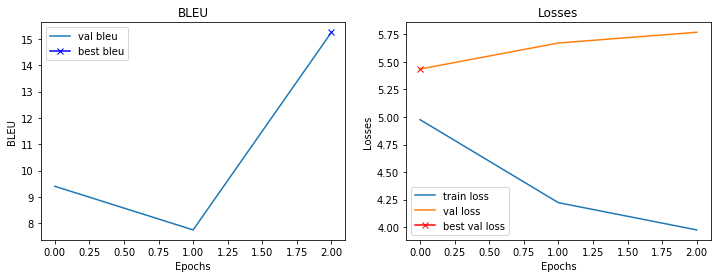

Epoch : 1200
Train example :
	Target: a boy pets a sleeping tiger .
	Output: a woman in a red shirt .
Random example:
	Target: a little girl wearing a white and red outfit is taking a picture of an adult .
	Output: a man in a red shirt and a woman in a red shirt and a woman in a red shirt and a woman
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a group of people are playing in a boat .
Train loss    : 3.8312788510322573
Val loss      : 6.000140085816383
Val bleu      : 13.902360561634339



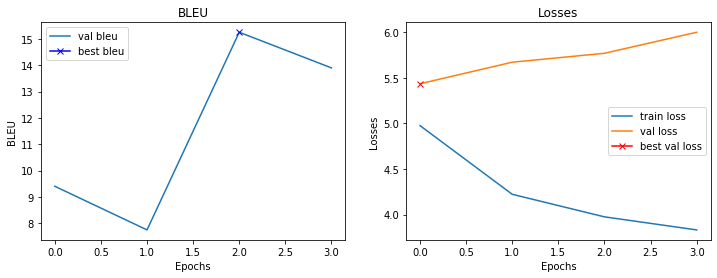

Epoch : 1500
Train example :
	Target: a race car zooms while onlookers watch .
	Output: a car car is through a of .
Random example:
	Target: 2 young people in the middle of a crowded area are playing music .
	Output: a group of people are walking down a street .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a group of people are playing in a pool .
Train loss    : 3.7073111216227215
Val loss      : 5.884459033608437
Val bleu      : 14.289172308522636



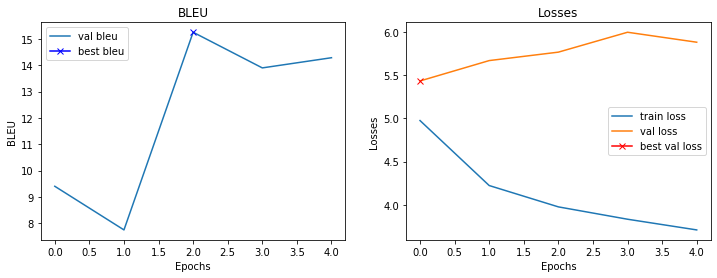

Epoch : 1800
Train example :
	Target: a woman wearing a purple jacket stands next to a horse .
	Output: a group is a blue shirt and on to a horse .
Random example:
	Target: a man walking along the platform at a subway station .
	Output: a man in a black shirt is standing in front of a building .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is a a blue shirt and a blue shirt is standing on a water .
Train loss    : 3.625366962750753
Val loss      : 5.920470833778381
Val bleu      : 11.643427610287443



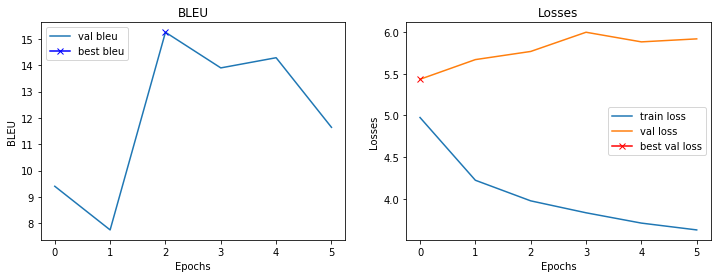

Epoch : 2100
Train example :
	Target: many people sitting at many tables .
	Output: a people are on a table .
Random example:
	Target: a man in a dark shiny suit plays the piano and sings on stage .
	Output: a man in a black shirt and a black shirt is playing a guitar .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a blue shirt is playing a a pool .
Train loss    : 3.559432098865509
Val loss      : 5.971270576119423
Val bleu      : 14.659319847016947



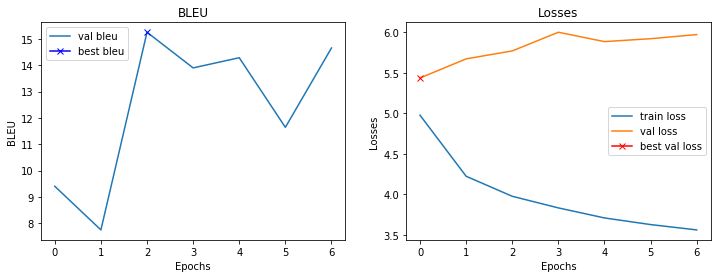

Epoch : 2400
Train example :
	Target: a boy is playing in a dark theater near the stage .
	Output: a man in playing a a park room . a street .
Random example:
	Target: a woman in a gray , long-sleeved shirt uses a machine at the gym .
	Output: a man in a blue shirt is standing on a sidewalk .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is a a a blue shirt and a blue shirt is standing in a pool .
Train loss    : 3.5046422783533733
Val loss      : 5.971583008766174
Val bleu      : 15.69767510240312



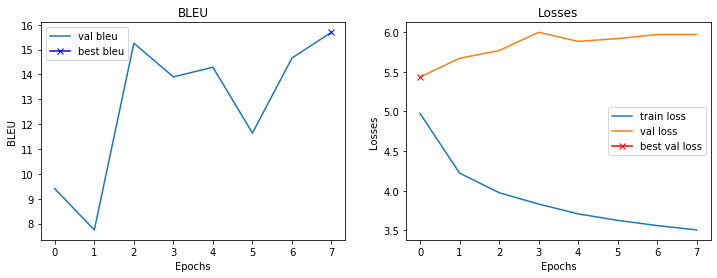

Epoch : 2700
Train example :
	Target: a woman in red is sitting on a bench .
	Output: a woman in a shirt sitting on a bench bench
Random example:
	Target: a person surfs through a wave as it crashes down .
	Output: a man in a blue shirt is standing on a beach .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is a a large of of people .
Train loss    : 3.473276355266571
Val loss      : 5.931931287050247
Val bleu      : 16.656935779369185



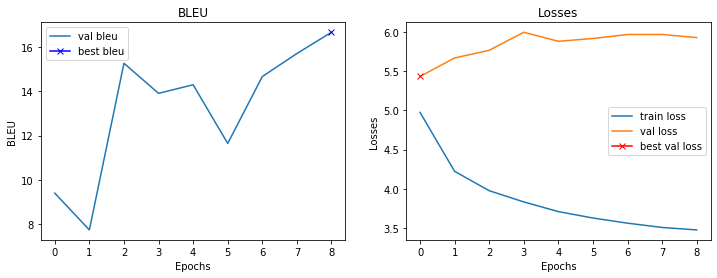

Epoch : 3000
Train example :
	Target: a boy is doing a skateboard trick on the boardwalk .
	Output: a man is jumping a trick trick on a ground .
Random example:
	Target: some people walking by the water .
	Output: a group of people walking down a snowy day .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is standing in a pool .
Train loss    : 3.4245479472478233
Val loss      : 5.924933135509491
Val bleu      : 18.074389025635767



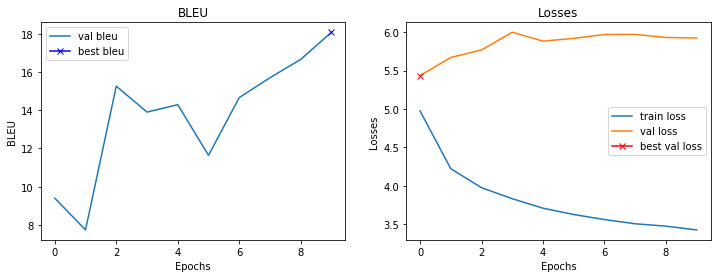

Epoch : 3300
Train example :
	Target: a long-haired man wearing a blue shirt and dark pants plays a guitar while sitting on a wood and metal bench with another man and woman in front of a UNK cafe rainbow mural .
	Output: a group man is a blue shirt and jeans pants is a violin . a on a bench bench a wall . a UNK in a woman the of a UNK . . . .
Random example:
	Target: a little girl in a paisley dress runs across a sandy playground .
	Output: a little girl in a pink shirt and blue shorts is running on a beach .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is sitting on a wooden slide .
Train loss    : 3.3990803861618044
Val loss      : 6.098760187625885
Val bleu      : 16.01868007540758



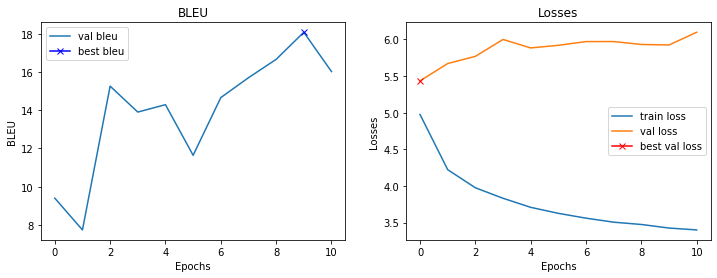

Epoch : 3600
Train example :
	Target: the boy is surfing .
	Output: a man is surfing on
Random example:
	Target: two cheerleaders in dark blue pants and bra style top with yellow pompoms mid cheer .
	Output: a man in a blue shirt and a blue shirt and a blue shirt and blue shorts and a blue shirt and black pants and a blue shirt and
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is standing in a pool with a large blue and white and white and white and white and white and white and white and white
Train loss    : 3.334054173628489
Val loss      : 5.96972319483757
Val bleu      : 15.7893477461785



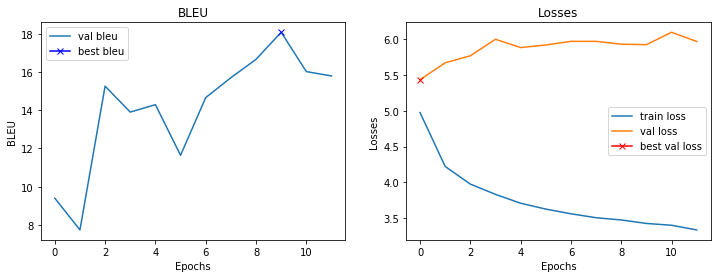

Epoch : 3900
Train example :
	Target: two men wearing work attire , stands next to an UNK , outside a large plant .
	Output: a men are working on are and a to a old . and of building . .
Random example:
	Target: a child with a helmet jumps over a pile of old tires .
	Output: a man in a blue shirt is sitting on a wooden structure .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man in a blue shirt is standing in a pool .
Train loss    : 3.304333021640778
Val loss      : 6.090169668197632
Val bleu      : 18.36186792224708



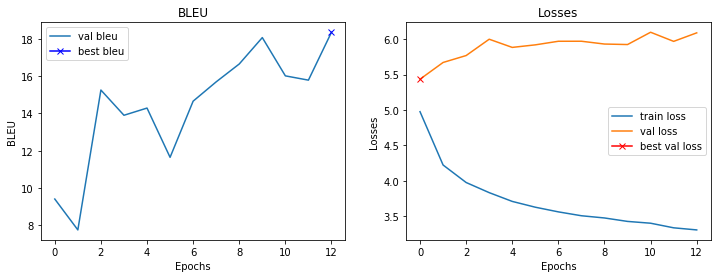

Epoch : 4200
Train example :
	Target: the cowboy is trying to take down the calf .
	Output: a cowboy cowboy is to lasso a a bucking of
Random example:
	Target: two young people riding skateboards pass by in the street as a black dog on a red leash stops in a doorway and squats down on the sidewalk .
	Output: a man in a red shirt and a red dog is walking down the sidewalk .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is playing a game in the air .
Train loss    : 3.2859171994527183
Val loss      : 6.032647326588631
Val bleu      : 17.877684457548625



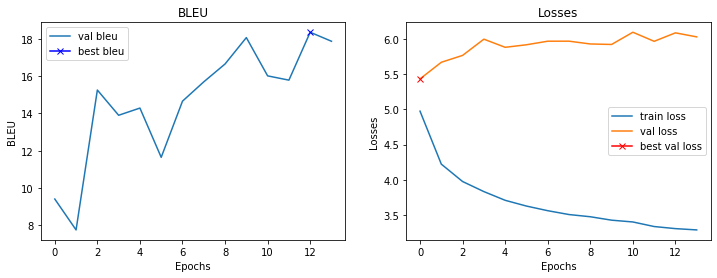

Epoch : 4500
Train example :
	Target: a black and white dog jumps over a bar .
	Output: a black and white dog is over a hurdle .
Random example:
	Target: two men in suits are on a stage giving a presentation .
	Output: a man in a black shirt is playing a guitar .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man is a a child in a pool .
Train loss    : 3.246145224571228
Val loss      : 6.102493658661842
Val bleu      : 17.014871797242183



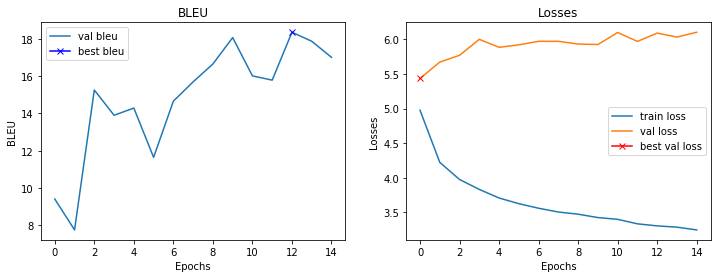

Epoch : 4800
Train example :
	Target: olympic bicyclists round a corner during competition .
	Output: a in are in race , a .
Random example:
	Target: six men sit in a field of crops containing wooden crates .
	Output: a group of people are standing in a field .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is a blue shirt and blue shorts is standing in a pool .
Train loss    : 3.233274466196696
Val loss      : 6.093490809202194
Val bleu      : 17.392267231514122



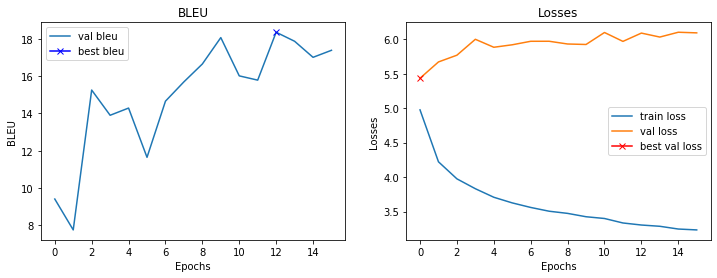

Epoch : 5100
Train example :
	Target: people are inside a cage riding horses .
	Output: a are riding a bull on a .
Random example:
	Target: a small child on a UNK swing ride at an amusement park .
	Output: a man in a red shirt is holding a pole in a parade .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is playing a game on a pool .
Train loss    : 3.1979420741399127
Val loss      : 6.156547367572784
Val bleu      : 16.910625788715105



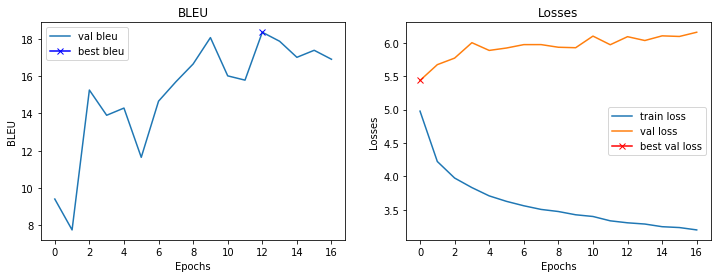

Epoch : 5400
Train example :
	Target: a man in a new york shirt waits to cross the street .
	Output: a man in a red york store is for a a street .
Random example:
	Target: two workers in yellow vests try to fix something .
	Output: a man in a red jacket is standing on a roof .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a blue shirt is standing on a dock .
Train loss    : 3.1794303615887958
Val loss      : 6.121292129158974
Val bleu      : 18.135890286793295



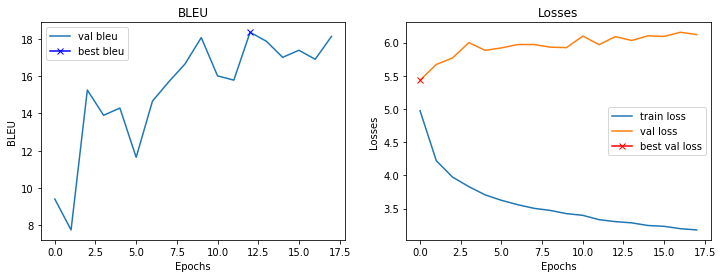

Epoch : 5700
Train example :
	Target: a man and a woman holding a camera are interacting in a chinatown marketplace .
	Output: a group and a woman are a large . standing . a parade . .
Random example:
	Target: a man is walking past a latin american produce shop .
	Output: a woman is selling a market .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is sitting on a table with a large blue and blue and blue and blue and blue and blue striped
Train loss    : 3.1695480132102967
Val loss      : 6.057785153388977
Val bleu      : 17.072182299685103



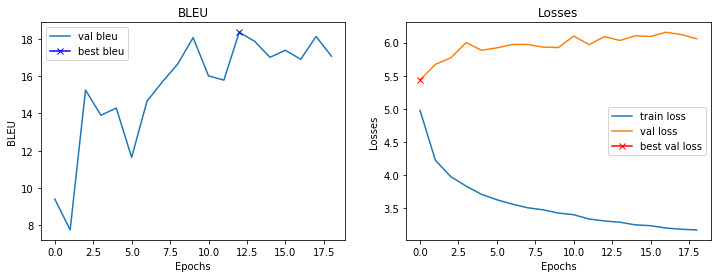

Epoch : 6000
Train example :
	Target: a woman pulls her raft into the water .
	Output: a woman in a clothes is a water .
Random example:
	Target: families are gathered in a park .
	Output: a group of people are sitting on a grass .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is sitting on a dock with a large statue of water .
Train loss    : 3.1364403788248696
Val loss      : 6.049109622836113
Val bleu      : 17.804711264819705



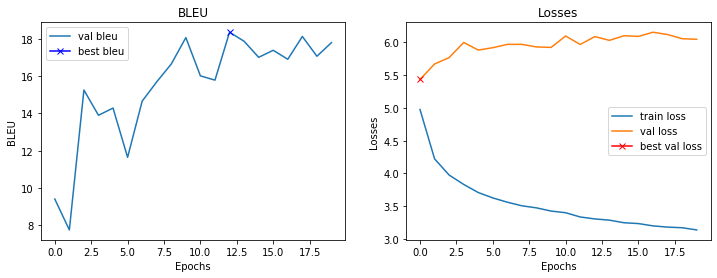

Epoch : 6300
Train example :
	Target: a man skis down a snowy hill .
	Output: a man in in a hill . .
Random example:
	Target: a soccer player removes his shirt .
	Output: a soccer game in a stadium .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a group of people are sitting on a dock .
Train loss    : 3.1231914869944255
Val loss      : 6.102603122591972
Val bleu      : 17.573967767743504



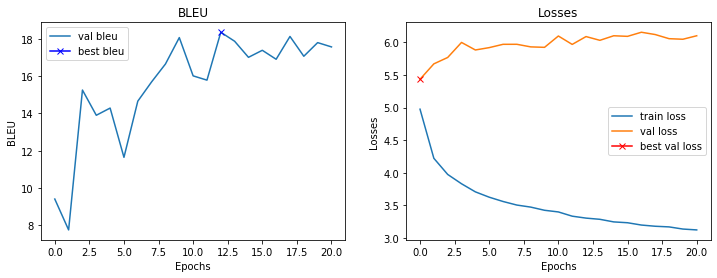

Epoch : 6600
Train example :
	Target: a shirtless man in front of a weathered brick wall outside .
	Output: a shirtless man is a of a brick wall wall . a
Random example:
	Target: a man wearing a number 3 jersey is about to kick a soccer ball .
	Output: a man in a blue shirt is kicking a soccer ball .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is sitting on a deck of a fountain .
Train loss    : 3.0822329179445904
Val loss      : 6.111575677990913
Val bleu      : 18.322874768458146



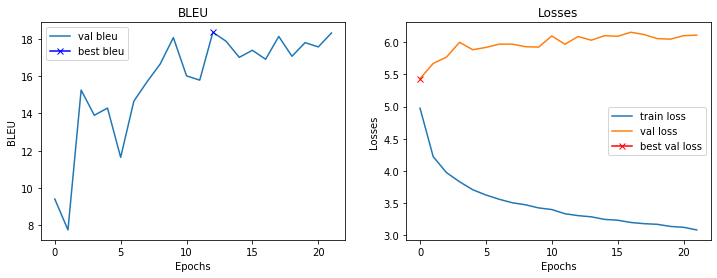

Epoch : 6900
Train example :
	Target: a woman with red-hair and a black shirt has her eyes closed and a mirror behind her .
	Output: a girl with red-hair hair a black shirt is her teeth . . a man . her .
Random example:
	Target: two young women posing for a picture
	Output: a woman in a black shirt and a woman in a black shirt and black shorts , are smiling .
Fixed example :
	Target: a group of children learning to swim .
	Output: a group of people are sitting on a deck .
Train loss    : 3.0936329038937886
Val loss      : 6.031263023614883
Val bleu      : 18.56447392145011



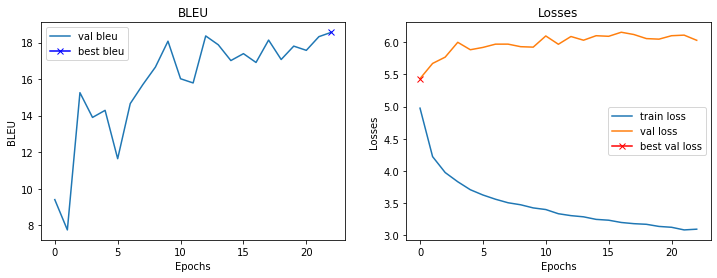

Epoch : 7200
Train example :
	Target: two men talk to each other behind an organ while a lone woman stands to their right .
	Output: a man are at a other in a organ . a man man in behind him a .
Random example:
	Target: a dog with one ear up runs outside through the fall leaves .
	Output: a black dog is running through a field .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is sitting on a dock with a large blue water .
Train loss    : 3.065472976366679
Val loss      : 6.265811413526535
Val bleu      : 17.627742177469628



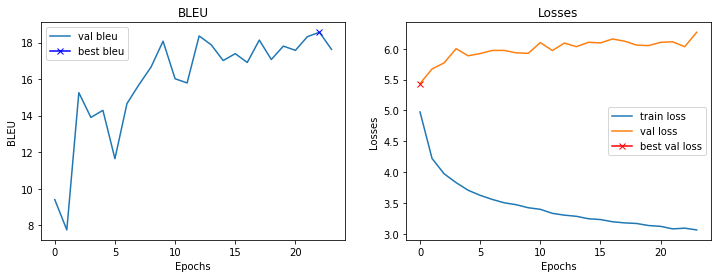

Epoch : 7500
Train example :
	Target: the new york city streets filled with UNK of people .
	Output: a crowd york york street . with many . a .
Random example:
	Target: a man in black pants and a white shirt crossing a bridge in front of a tan building .
	Output: a man in a white shirt is standing on a bridge .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is on a bench with a large of water .
Train loss    : 3.068755133152008
Val loss      : 6.029097035527229
Val bleu      : 19.796037053663746



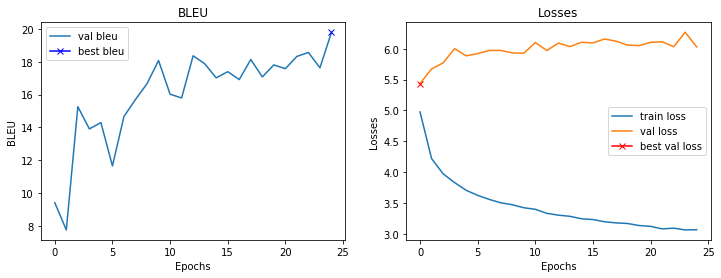

Epoch : 7800
Train example :
	Target: young girl sips a drink on a blue bench .
	Output: a boy in a a from a playground slide .
Random example:
	Target: two people sit on a couch overlooking the view of a city .
	Output: a man and woman are sitting on a couch .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is sitting on a bench with a large blue and white water .
Train loss    : 3.0296851189931235
Val loss      : 6.154199108481407
Val bleu      : 18.67537866174999



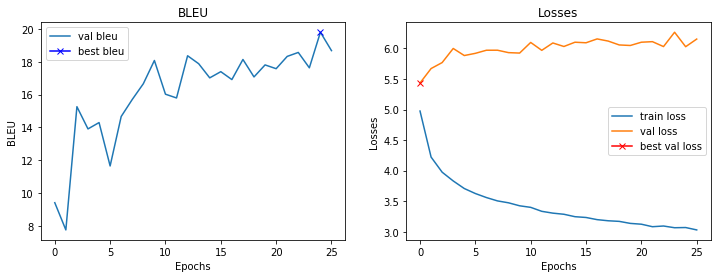

Epoch : 8100
Train example :
	Target: a man sits on a bench near the beach , tying his shoe .
	Output: a man in on a wooden near a water . looking a head .
Random example:
	Target: a man in an orange top and blue pants carries a lot of boxes while a woman pulling a pink bag goes in the other direction .
	Output: a man in a red shirt is walking down a street .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is playing with a carnival .
Train loss    : 3.040793358484904
Val loss      : 6.182025820016861
Val bleu      : 19.02960179715579



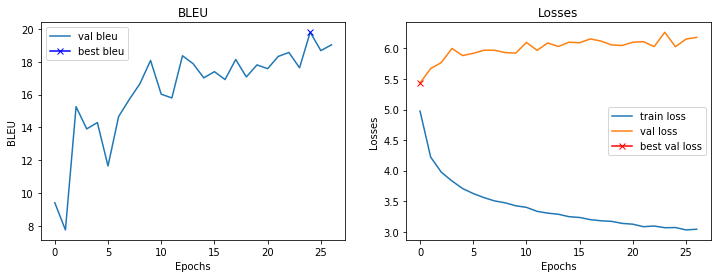

Epoch : 8400
Train example :
	Target: the girl in the blue coat is holding a purple UNK water bottle .
	Output: two woman in a blue jacket is holding a woman and white . .
Random example:
	Target: a crowd of people is facing the same direction while some hold their hands in the air .
	Output: a woman in a red dress is holding a woman in a red dress .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is sitting on a boat with a water .
Train loss    : 3.0416591207186383
Val loss      : 6.122868150472641
Val bleu      : 18.154431449872867



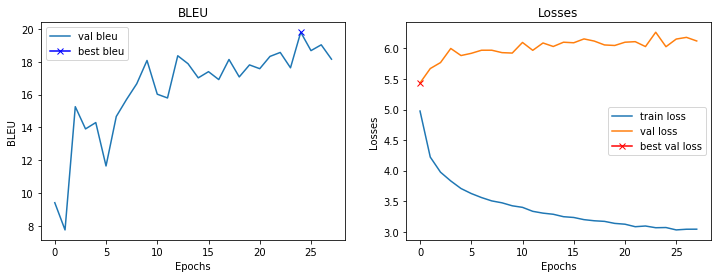

Epoch : 8700
Train example :
	Target: an asian woman dances with long ribbons , she is mid jump with her legs pointed to the right and the red ribbons flowing on either side of her
	Output: a asian woman is in a hair . and is twirling . . her arms . . her air . her other UNK . her the . of a head
Random example:
	Target: a small white kid holding a black umbrella in front of him , in order to block the UNK water being shot out from a red firetruck in the parking lot .
	Output: a woman in a rain rain .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man and a woman are standing on a ledge .
Train loss    : 3.000594263871511
Val loss      : 6.238719075918198
Val bleu      : 17.418480583105346



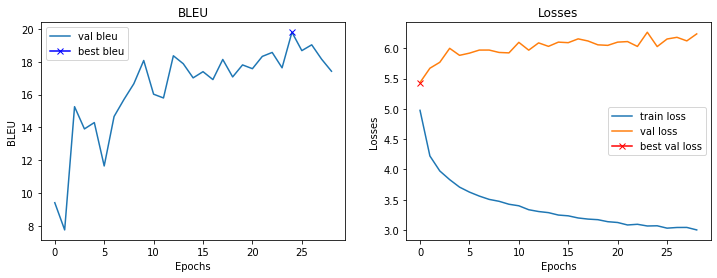

Epoch : 9000
Train example :
	Target: green trees , grass , one man standing , another bending down .
	Output: two man in a in and is is in and man and and
Random example:
	Target: a man with his shirt off standing in a work zone next to a pile of bricks .
	Output: a shirtless man in a blue shirt and shorts is standing on a beach .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a blue shirt is standing on a ladder .
Train loss    : 3.0038139621416726
Val loss      : 6.0703020095825195
Val bleu      : 19.21948056423537



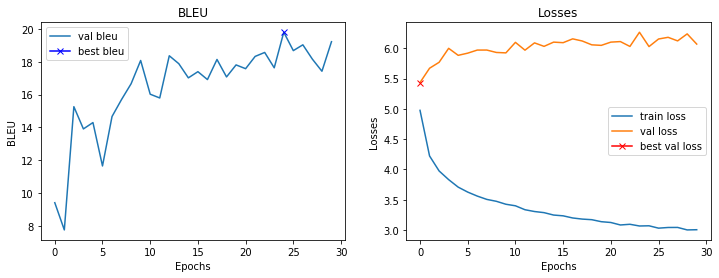

Epoch : 9300
Train example :
	Target: a little girl is licking a dinner plate and getting food all over her face .
	Output: a girl girl is eating a ice . . a girl . . her . .
Random example:
	Target: a girl dressed for winter stands in front of some graffiti .
	Output: a young boy in a blue coat and a coat and a hat .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is sitting on a bench with a ball in the background .
Train loss    : 2.9679377992947895
Val loss      : 6.0982354283332825
Val bleu      : 18.55022190867607



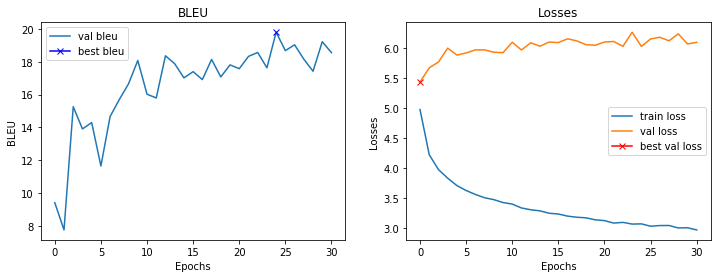

Epoch : 9600
Train example :
	Target: a woman in a blue outfit is upside down with her body UNK .
	Output: a young in a red leotard is jumping on a a balance . .
Random example:
	Target: a cowboy in a rodeo trying to beat the 8 second clock .
	Output: a man in a blue shirt is riding a bucking bronco .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man in a black shirt is standing on a ledge .
Train loss    : 2.9428537042935687
Val loss      : 6.270433127880096
Val bleu      : 19.161177053161744



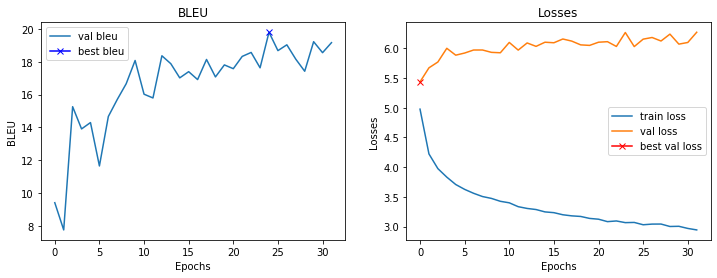

Epoch : 9900
Train example :
	Target: a man is kissing the forehead of a baby that is lying on a couch .
	Output: a man with holding his baby while a baby . is crying on his couch .
Random example:
	Target: a man wearing a white shirt taking a nap with a green hat over his eyes .
	Output: a man in a black shirt and a black hat is working on a dirt .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is a woman in a pool .
Train loss    : 2.925103203455607
Val loss      : 6.100123658776283
Val bleu      : 18.93549235746535



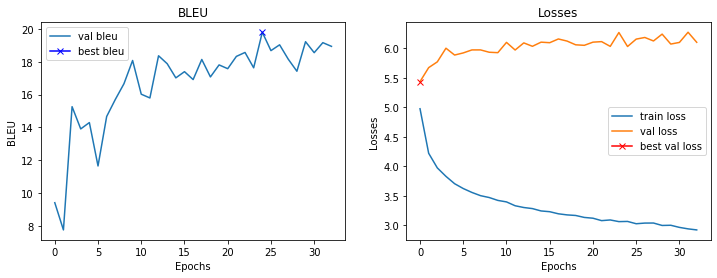

Epoch : 10200
Train example :
	Target: guy in art UNK glass home .
	Output: a sitting in on in a window
Random example:
	Target: college students enjoy time out of class in a field .
	Output: a young boy in a white shirt and a woman in a bikini are sitting on a grass .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is sitting on a floor with a water .
Train loss    : 2.9344517668088277
Val loss      : 6.164676085114479
Val bleu      : 18.66456652462335



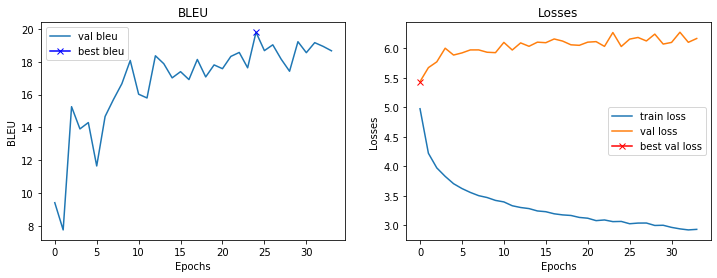

Epoch : 10500
Train example :
	Target: a crowd of people gathered around the exit while a large ship is featured on the tv screen .
	Output: a group of people are around a subway . a tv of is looking by the floor . .
Random example:
	Target: a man and his children ride a four-wheeler outside .
	Output: a man and a woman are sitting on a dirt road .
Fixed example :
	Target: a group of children learning to swim .
	Output: a boy is playing with a game of water .
Train loss    : 2.9516628996531167
Val loss      : 6.13653726875782
Val bleu      : 19.77262769268714



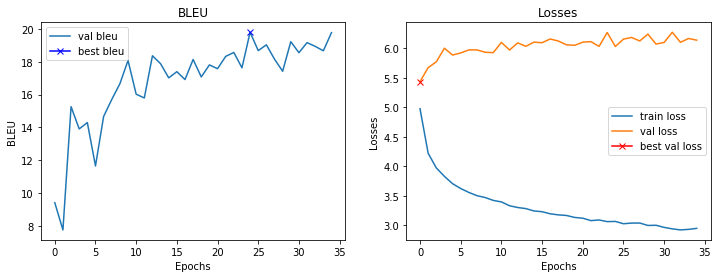

Epoch : 10800
Train example :
	Target: a fluffy white dog runs through the woods with his ears flapping in the breeze .
	Output: a white dog dog runs through a grass . a mouth . . the mouth .
Random example:
	Target: two barefoot female ethnic dancers perform in colorful traditional garb .
	Output: a man in a costume is playing a guitar .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is sitting on a deck with a UNK .
Train loss    : 2.921839756965637
Val loss      : 6.164054363965988
Val bleu      : 19.283641674917025



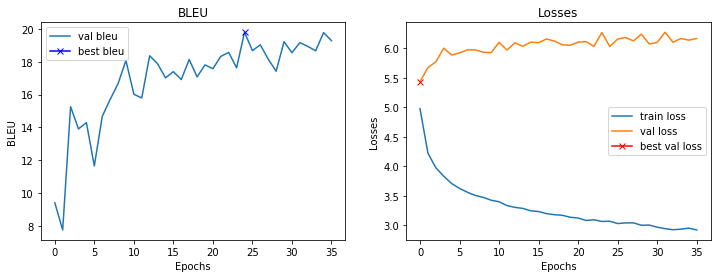

Epoch : 11100
Train example :
	Target: children playing in an outdoor pool as a woman watches from the side .
	Output: a are in a outdoor pool .
Random example:
	Target: woman in ethnic garments dancing .
	Output: a woman with a red and white shirt and a black shirt is holding a stick .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man is playing with a colorful balloon .
Train loss    : 2.902955379486084
Val loss      : 6.185911536216736
Val bleu      : 18.15193284641692



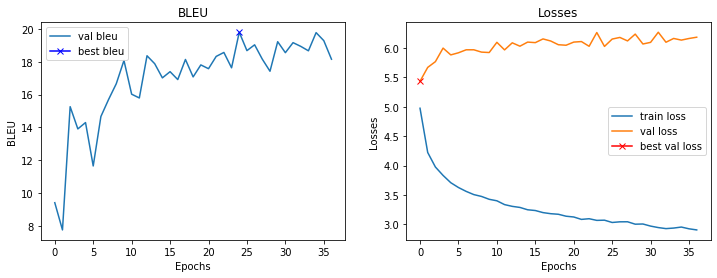

Epoch : 11400
Train example :
	Target: asian men sit on a bench .
	Output: a man in in a bench .
Random example:
	Target: a young woman wearing native dress is working with a frame .
	Output: a woman is sitting on a chair with a UNK of a loom .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is sitting on a bench with a water fountain .
Train loss    : 2.9030447006225586
Val loss      : 6.139878809452057
Val bleu      : 19.410701229230895



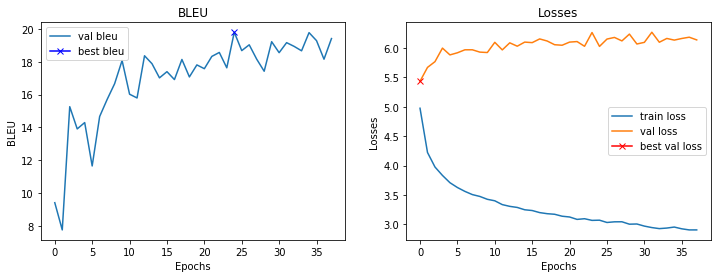

Epoch : 11700
Train example :
	Target: a woman in a white polo shirt is moving a black statue of a bear .
	Output: a man in a white shirt shirt is standing a black statue of a statue statue
Random example:
	Target: a brunette woman wearing dark glasses and a red blouse is eating .
	Output: a woman with red-hair is wearing a blue shirt and sunglasses .
Fixed example :
	Target: a group of children learning to swim .
	Output: a group of people are standing on a dock with a fish in the background .
Train loss    : 2.8843897136052448
Val loss      : 6.1018276661634445
Val bleu      : 19.292275141122975



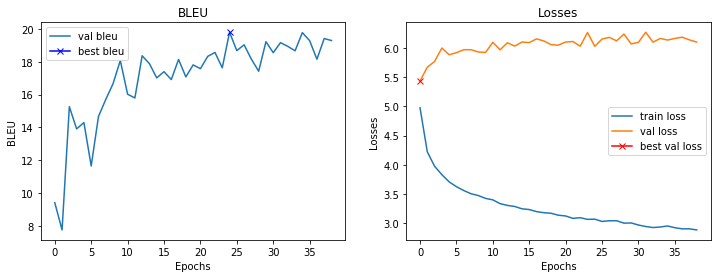

Epoch : 12000
Train example :
	Target: a young man in a hard hat and safety vest sitting in a pickup while another man holds on in the passenger seat .
	Output: a man in wearing a green hat and a vest is on a car . a man is a the the background . .
Random example:
	Target: a man putting shingles on a roof .
	Output: a man in a blue shirt and blue jeans is working on a roof .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is sitting on a stool in a pool .
Train loss    : 2.885400807062785
Val loss      : 6.18384775519371
Val bleu      : 18.69005282610577



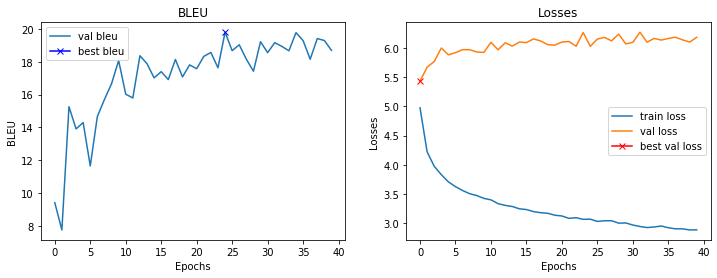

Epoch : 12300
Train example :
	Target: a man in black shorts is boxing against and man in white shorts .
	Output: two shirtless in a shorts and a . a boxer . shorts shorts .
Random example:
	Target: a group of women in matching outfits surrounds musicians on a street .
	Output: a group of people are standing in a street .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a group of people are playing in a pool .
Train loss    : 2.8709882577260335
Val loss      : 6.1483791172504425
Val bleu      : 18.5725557248856



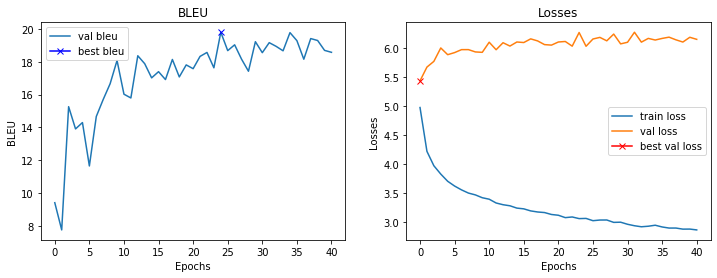

Epoch : 12600
Train example :
	Target: a person in a uniform waiting next to luggage near an open plane door with two other people in the background .
	Output: a man is a blue a in the airplane .
Random example:
	Target: a beige dog and brown dog in the snow .
	Output: a dog is biting a stick in the snow .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man and a woman are playing a game of water .
Train loss    : 2.872149930795034
Val loss      : 6.199776232242584
Val bleu      : 18.77450127112023



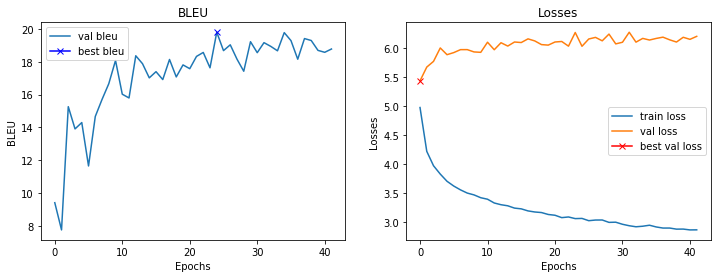

Epoch : 12900
Train example :
	Target: a man dressed as a mariachi player holds a small guitar and sings .
	Output: a man in in a pirate is is a guitar guitar . a into
Random example:
	Target: a child in a light blue shirt crying .
	Output: a young boy in a blue shirt is holding a blue and white striped shirt .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man in a red shirt is sitting on a stool in a pool .
Train loss    : 2.8712412865956622
Val loss      : 6.316012158989906
Val bleu      : 17.744291987672625



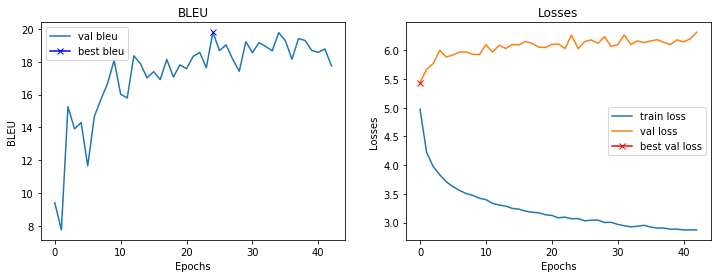

Epoch : 13200
Train example :
	Target: one man , shirtless , and a woman , clothed , jumping in the water .
	Output: a man in a is wearing a woman in are in are in the water .
Random example:
	Target: a man holding a child 's hand as they walk .
	Output: a man in a blue shirt and blue jeans is walking on a sidewalk .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a hat is standing on a roof .
Train loss    : 2.840115552743276
Val loss      : 6.172863394021988
Val bleu      : 19.67595935002075



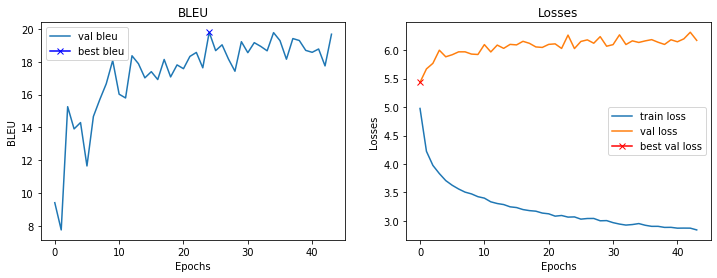

Epoch : 13500
Train example :
	Target: a man known as UNK speaks at a UNK .
	Output: a man in a a UNK . a restaurant .
Random example:
	Target: a boy runs along a beach while a group of young girls watch .
	Output: a little boy in a red shirt is walking through the water .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a black shirt is standing on a ladder .
Train loss    : 2.8376223134994505
Val loss      : 6.133571624755859
Val bleu      : 20.524109108485717



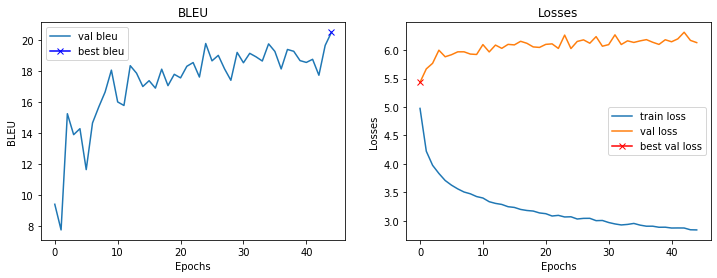

Epoch : 13800
Train example :
	Target: a girl in a red and white costume standing on the street .
	Output: a woman in a red and white outfit is in a street .
Random example:
	Target: two baseball players trying to catch a ball in the outfield .
	Output: a boy in a red uniform is playing a game of a goal .
Fixed example :
	Target: a group of children learning to swim .
	Output: two children are playing with a ball in a pool .
Train loss    : 2.826551764011383
Val loss      : 6.1910193264484406
Val bleu      : 19.487823971813885



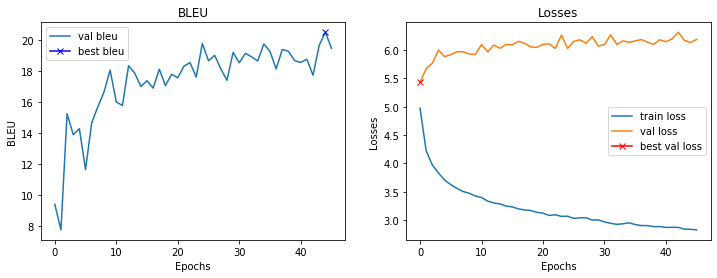

Epoch : 14100
Train example :
	Target: busy marketplace in an arabian country .
	Output: a street in a urban country .
Random example:
	Target: two males are running in an uncrowded area .
	Output: a woman is walking on a busy street .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is on a skateboard in a pool .
Train loss    : 2.829460597038269
Val loss      : 6.123602315783501
Val bleu      : 19.305409504020936



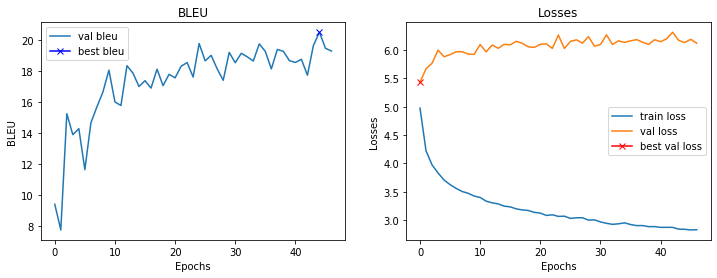

Epoch : 14400
Train example :
	Target: four people playing soccer on a brown surface .
	Output: a man in a on a course surface .
Random example:
	Target: a tennis player in a red outfit .
	Output: a woman in a red shirt and white tennis tennis .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two children are playing in a pool .
Train loss    : 2.8066121967633566
Val loss      : 6.281615719199181
Val bleu      : 19.120250607722276



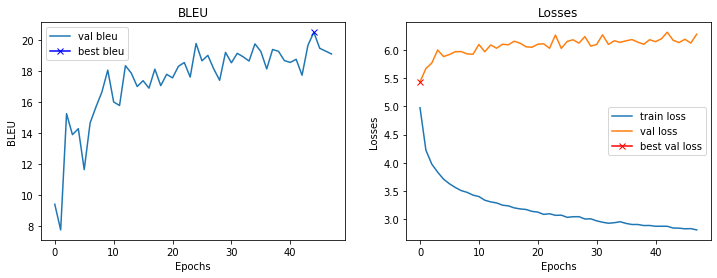

Epoch : 14700
Train example :
	Target: a man wit a green collared shirt and a camera sits at a curb .
	Output: a man with a cigarette shirt and and a blue is in a table .
Random example:
	Target: a UNK street artist draws a caricature of a redheaded woman on the side of the street .
	Output: a woman in a blue shirt and a black skirt is sitting on a bench with a newspaper .
Fixed example :
	Target: a group of children learning to swim .
	Output: two children are playing in a pool .
Train loss    : 2.8052515133221942
Val loss      : 6.175539806485176
Val bleu      : 19.12263525503462



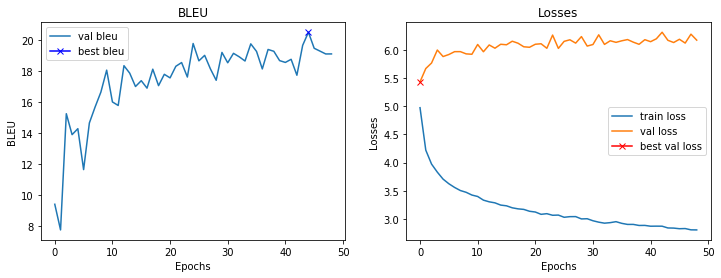

Epoch : 15000
Train example :
	Target: hiker walking along high rocks in front of a blue sky with puffy white clouds .
	Output: a in down side rock . the of a large wall . a blue sky .
Random example:
	Target: two children are running down the sidewalk in front of a building .
	Output: a man in a suit walks down the street in front of a large building .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a boy in a red shirt is playing with a ball in a pool .
Train loss    : 2.7946179835001628
Val loss      : 6.235653460025787
Val bleu      : 19.03766275913312



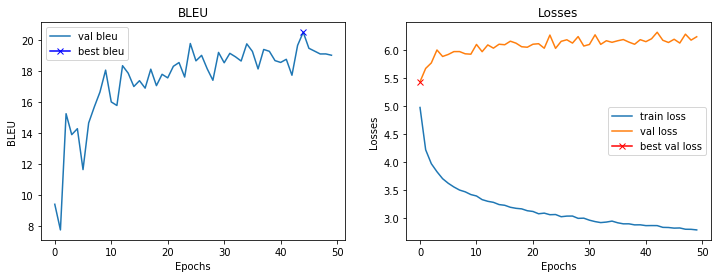

Epoch : 15300
Train example :
	Target: a young girl UNK off by a fountain in a park .
	Output: a woman girl in in a a fountain in a fountain .
Random example:
	Target: a woman in a pink skirt is serving a ball in a tennis game .
	Output: a woman in a white shirt and blue tennis shoes is playing tennis .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a group of people are playing in a pool .
Train loss    : 2.7800524918238323
Val loss      : 6.26585391163826
Val bleu      : 19.688183723287832



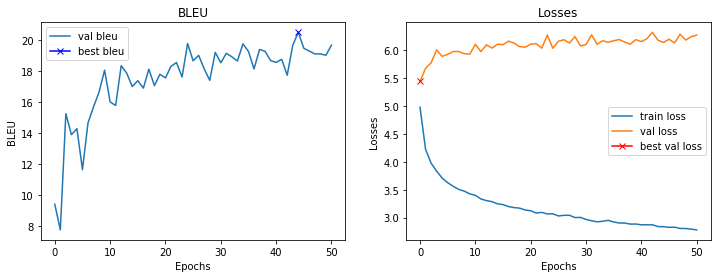

Epoch : 15600
Train example :
	Target: a person is taking a walk on a rocky trail .
	Output: a man in standing a break in a rocky path .
Random example:
	Target: two women , one with tattoos , hold each other and smile .
	Output: a woman with a black tank top and a woman in a black shirt and a woman in a black shirt and a woman in a black dress
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a yellow shirt is standing on a ladder .
Train loss    : 2.7700290791193645
Val loss      : 6.30010811984539
Val bleu      : 18.937280917056658



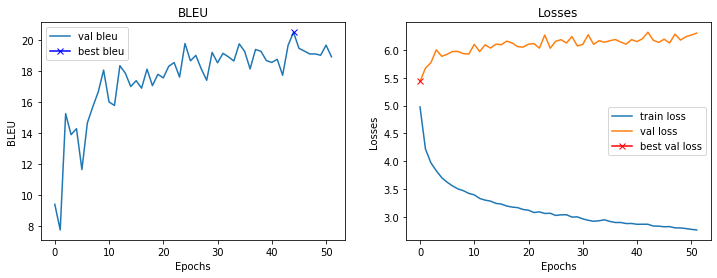

Epoch : 15900
Train example :
	Target: a group of people standing in the water on a sunny day .
	Output: a group of people are in the water . a beach day .
Random example:
	Target: four girls are sitting in a hot tub .
	Output: a man is in a tub with a tub in his hands .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man is painting a wall with a blue bucket .
Train loss    : 2.771681547164917
Val loss      : 6.24446314573288
Val bleu      : 19.049817014563356



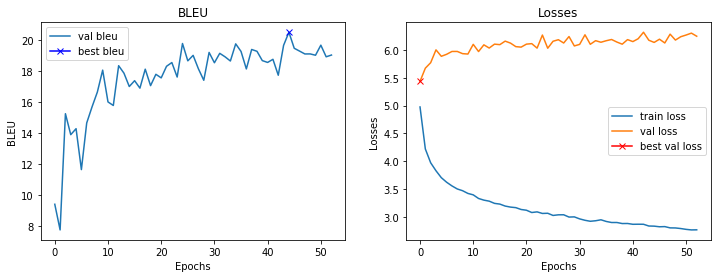

Epoch : 16200
Train example :
	Target: a black limo is parked next to a crowded staircase .
	Output: a group limo and parked in to a small street .
Random example:
	Target: two UNK in a field .
	Output: a brown dog is jumping up a grassy hill .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a red shirt is holding a child in a pool .
Train loss    : 2.7693477217356364
Val loss      : 6.32823871076107
Val bleu      : 18.88528803908765



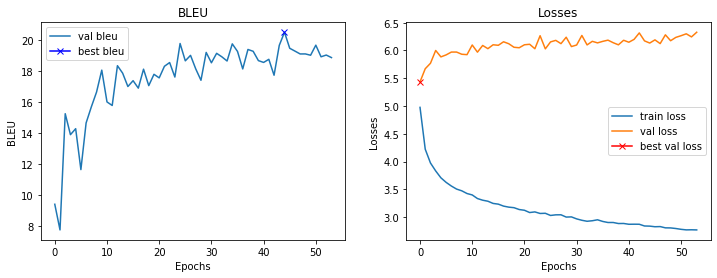

Epoch : 16500
Train example :
	Target: young black girl riding pony at petting zoo .
	Output: a man and white a white a . .
Random example:
	Target: a woman with a pink shirt walks down the street .
	Output: a man in a blue shirt and jeans is walking down the sidewalk .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man in a yellow shirt is bowling down a ramp .
Train loss    : 2.7627178994814554
Val loss      : 6.2533658146858215
Val bleu      : 19.89044687229222



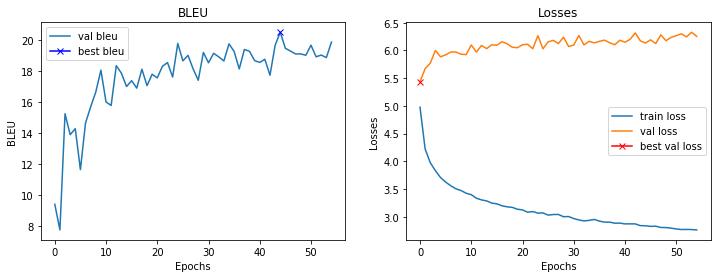

Epoch : 16800
Train example :
	Target: a person rides a bike in front of an elaborately painted building .
	Output: a man is a bike in front of a building building building .
Random example:
	Target: a tall man in a green sweater is holding his hands out at chest height like he is holding a book in a room of 3 people .
	Output: a man in a gray shirt is talking to a woman in a white shirt .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two children are playing in a water fountain .
Train loss    : 2.7457662494977315
Val loss      : 6.212630093097687
Val bleu      : 19.918145751127568



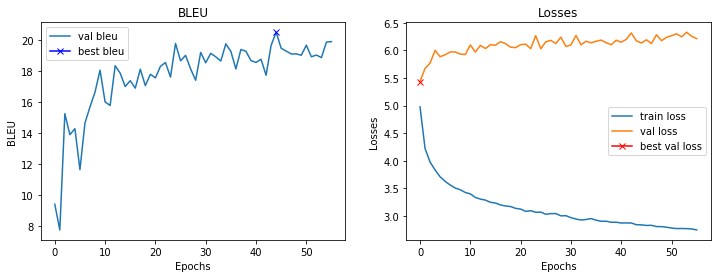

Epoch : 17100
Train example :
	Target: a man rows a boat in a lake near mountains .
	Output: a man in in boat in the lake . water .
Random example:
	Target: three men sit outside of a cafe .
	Output: a man in a yellow shirt sitting in front of a restaurant .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man in a yellow shirt is standing on a ladder .
Train loss    : 2.7535716859499613
Val loss      : 6.317215323448181
Val bleu      : 19.41408927329398



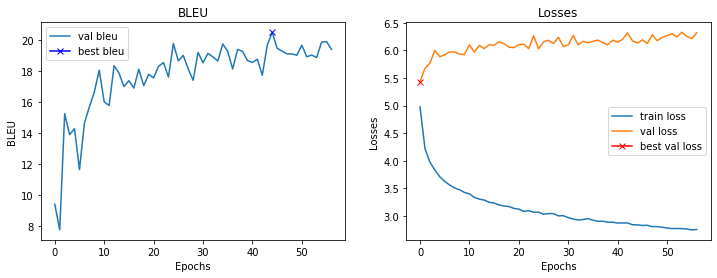

Epoch : 17400
Train example :
	Target: five UNK playing on the street .
	Output: a men are instruments the street .
Random example:
	Target: an old woman in a scarf is in the city .
	Output: a man in a red hat is standing in a city street .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man is on a board in a pool .
Train loss    : 2.746286013921102
Val loss      : 6.2637058198452
Val bleu      : 20.13593018631289



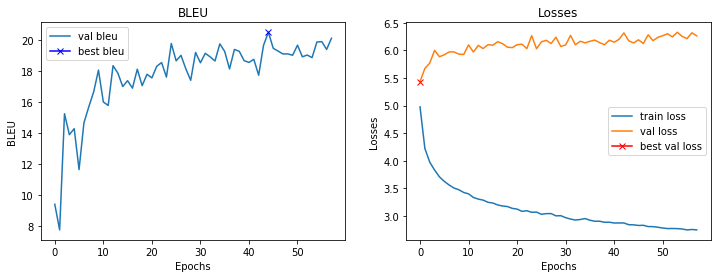

Epoch : 17700
Train example :
	Target: people under a blue umbrella walking .
	Output: a walking a umbrella umbrella , down
Random example:
	Target: a man and child are laughing together .
	Output: a man in a blue shirt and glasses is sitting on a couch .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is on a bridge while a man in a black shirt and blue shorts is standing on the floor .
Train loss    : 2.7149973503748575
Val loss      : 6.416076481342316
Val bleu      : 18.088593000296253



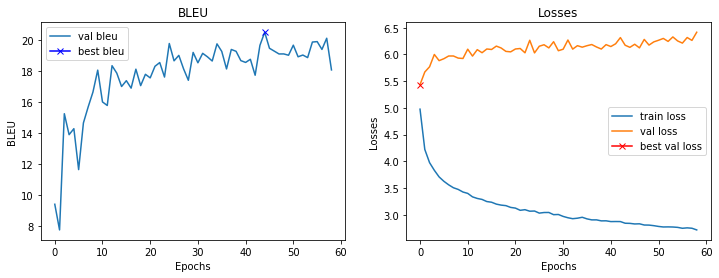

Epoch : 18000
Train example :
	Target: a seagull watches a woman in a sweater and scarf reading the newspaper .
	Output: a woman woman a man sitting a black shirt white sitting on book .
Random example:
	Target: a man wearing all black sits on a wooden bench and reads , his umbrella is open nearby on the ground .
	Output: a man sitting on a bench with a red umbrella .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is a blue shirt and a woman in a white shirt are standing on a ledge .
Train loss    : 2.739498957792918
Val loss      : 6.291162773966789
Val bleu      : 18.55725948647124



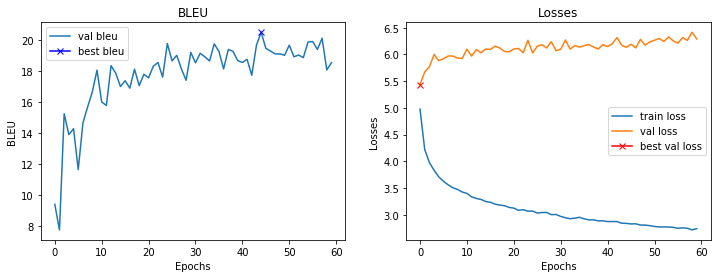

Epoch : 18300
Train example :
	Target: customers shopping in food court market .
	Output: people are in a at . .
Random example:
	Target: the man in a blue shirt , wearing a helmet , is readying to climb .
	Output: a man climbing a large rock .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man in a black shirt is playing on a carnival game .
Train loss    : 2.7194882623354593
Val loss      : 6.292185768485069
Val bleu      : 19.747968215298293



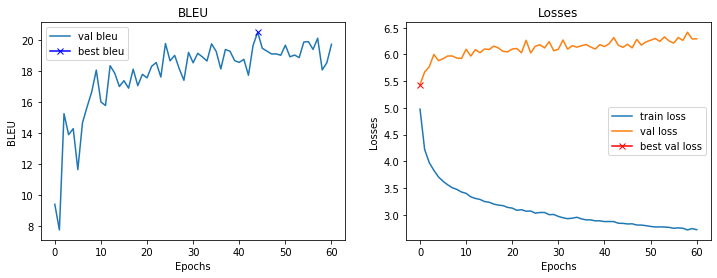

Epoch : 18600
Train example :
	Target: construction workers in overalls working .
	Output: a workers are hard are on
Random example:
	Target: a man and a woman is walking with a dog across a beach
	Output: a dog walks on the beach .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is sitting on a floor with a ball in his mouth .
Train loss    : 2.714316434065501
Val loss      : 6.272014603018761
Val bleu      : 19.432768751972183



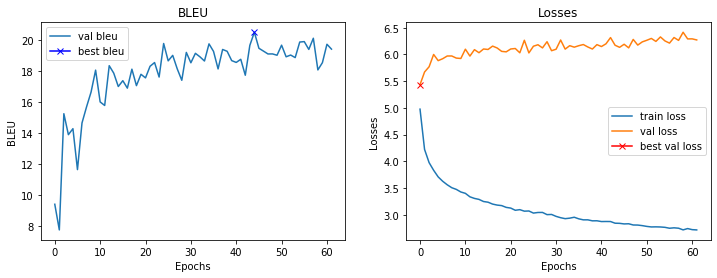

Epoch : 18900
Train example :
	Target: a lady is wearing jeans and a cardboard costume designed to look like the cartoon character UNK
	Output: a group in wearing a UNK costume robot costume .
Random example:
	Target: a group of UNK are walking in the city .
	Output: a man in a red hat and red hat is walking down a street .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man in a black shirt and blue shorts is standing on a roof .
Train loss    : 2.7185536456108093
Val loss      : 6.292937695980072
Val bleu      : 18.513840559558314



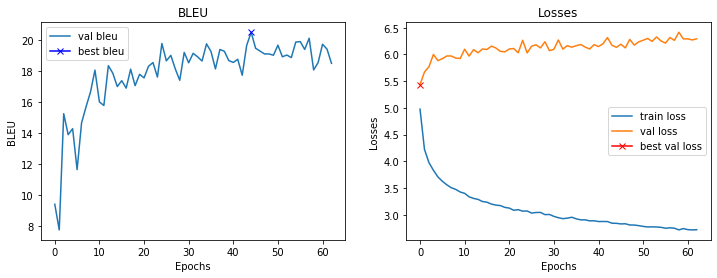

Epoch : 19200
Train example :
	Target: a young teenage girl talks to another teenager with a red sweatshirt .
	Output: two woman girl girl in to a man . a red shirt .
Random example:
	Target: a man covering a mailbox with a black trash bag .
	Output: a man in a black shirt and black pants is carrying a box box .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two children are playing a game of water on a water slide .
Train loss    : 2.6924635831514996
Val loss      : 6.321238115429878
Val bleu      : 19.14128043928715



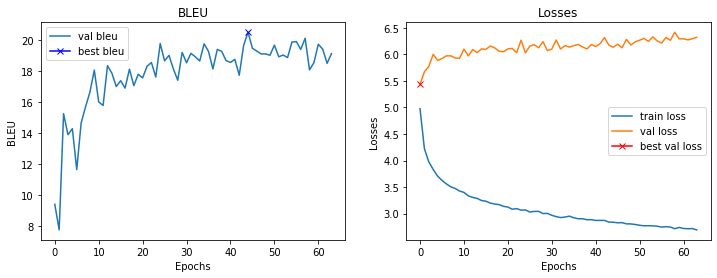

Epoch : 19500
Train example :
	Target: a man grins and holds up a white coffee cup while sitting near a tree .
	Output: a man with his holding a a cup cup . . sitting on a man .
Random example:
	Target: a woman in a brown , UNK jacket and green boots watches some activity high in the grating along a quiet street .
	Output: a man in a white shirt and jeans is walking down the street .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man is painting a picture of a woman in a pool .
Train loss    : 2.689180989265442
Val loss      : 6.216631174087524
Val bleu      : 19.38278030098975



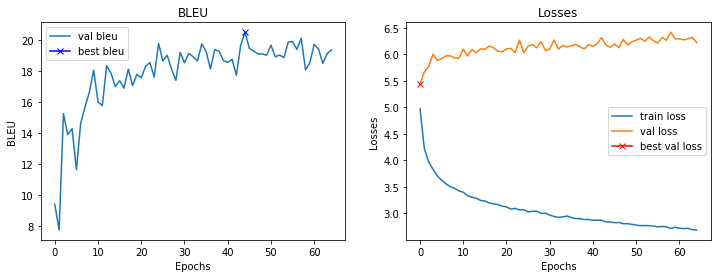

Epoch : 19800
Train example :
	Target: a baby in blue is standing on a sidewalk .
	Output: a woman in a and standing in a sidewalk .
Random example:
	Target: a woman wearing a red helmet is holding a rope and smiling .
	Output: a man wearing a red hat and a plaid shirt is holding a piece of paper .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man in a black shirt and blue shorts is playing on a pool .
Train loss    : 2.689033668835958
Val loss      : 6.228496819734573
Val bleu      : 19.72660303108558



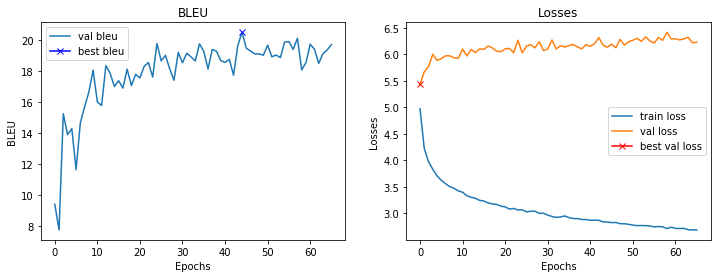

Epoch : 20100
Train example :
	Target: the brown dog is playing with a stick .
	Output: a dog is is running with a stick in
Random example:
	Target: a worker rests his foot on the back of a trailer .
	Output: a man in a yellow shirt is shoveling snow .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a white shirt is painting a mural .
Train loss    : 2.667997601032257
Val loss      : 6.208557799458504
Val bleu      : 19.933899434895366



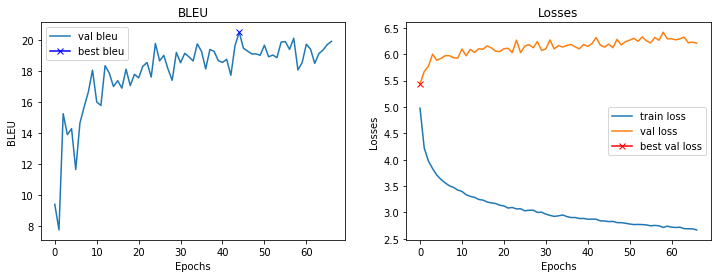

Epoch : 20400
Train example :
	Target: a man in a white t-shirt with a red logo is wearing colored beads whilst carrying a flag past a row of spectators .
	Output: a man in a UNK shirt and mardi flag flag is holding a and and holding a flag flag a parade of people .
Random example:
	Target: a little girl is running .
	Output: a little girl in a pink dress is jumping in the sand .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is a black shirt and shorts is climbing a wall .
Train loss    : 2.680254341761271
Val loss      : 6.317269712686539
Val bleu      : 19.346900994202894



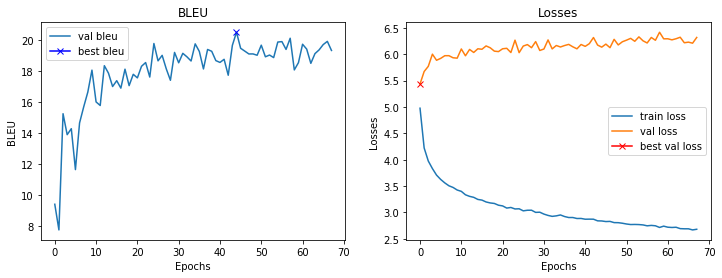

Epoch : 20700
Train example :
	Target: there is a girl creating art in this picture .
	Output: a is a woman in a on a a .
Random example:
	Target: a young man standing outside of a fire stairway .
	Output: a man in a yellow shirt is sitting on a construction site .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two people are on a dock .
Train loss    : 2.6525440629323325
Val loss      : 6.372814252972603
Val bleu      : 19.1517541326736



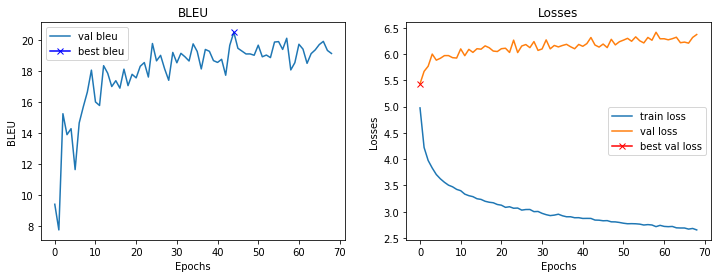

Epoch : 21000
Train example :
	Target: two girls read from a book together .
	Output: two young are on a book . .
Random example:
	Target: a dog running down a paved road .
	Output: a small dog is walking on the beach .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is sitting on the floor of a pool .
Train loss    : 2.6402243304252626
Val loss      : 6.336896136403084
Val bleu      : 19.133750568829385



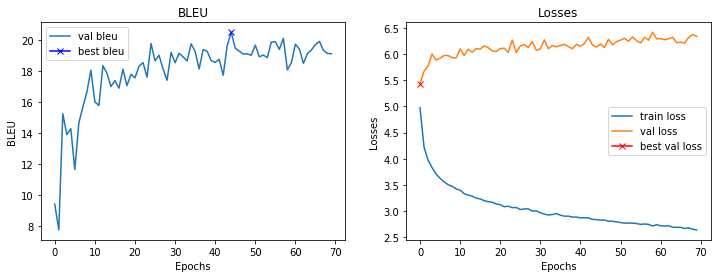

Epoch : 21300
Train example :
	Target: a person is sledding down a hill of snow , with an expression of excitement on their face .
	Output: a man is sledding down a snow hill snow . while a adult on his in his faces .
Random example:
	Target: a shirtless man is being filmed in the middle of a soccer field .
	Output: a soccer player is running on the field .
Fixed example :
	Target: a group of children learning to swim .
	Output: two men are sitting on a dock with a water in the background .
Train loss    : 2.6593684061368306
Val loss      : 6.329892888665199
Val bleu      : 18.669154083446422



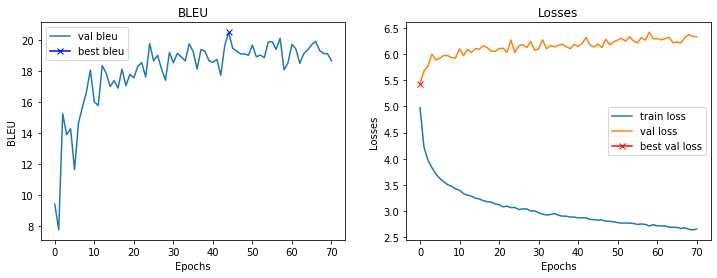

Epoch : 21600
Train example :
	Target: a lady in capri jeans and dark sleeveless top watches some guys preparing for a race .
	Output: a group in a is and a pants is is a people of a a race .
Random example:
	Target: two girls playing at the beach one in pink and the other in black .
	Output: a woman runs through the water on the beach .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two people are playing in a water slide .
Train loss    : 2.6301618909835813
Val loss      : 6.364022925496101
Val bleu      : 18.99493420581045



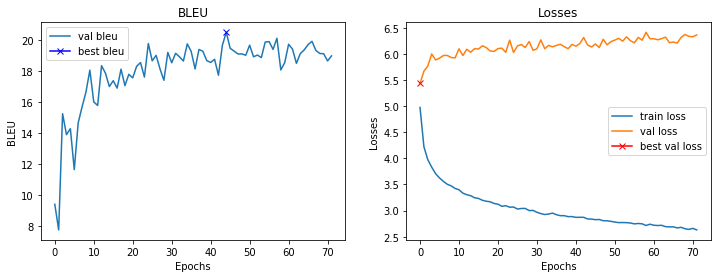

Epoch : 21900
Train example :
	Target: children gather happily around a toy .
	Output: a playing around with a toy .
Random example:
	Target: a man playing a xylophone in an open area .
	Output: a man in a blue shirt is standing next to a man in a black shirt and a black hat .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man is painting a wall of a man in a red shirt .
Train loss    : 2.623544133504232
Val loss      : 6.342112362384796
Val bleu      : 19.190083522444077



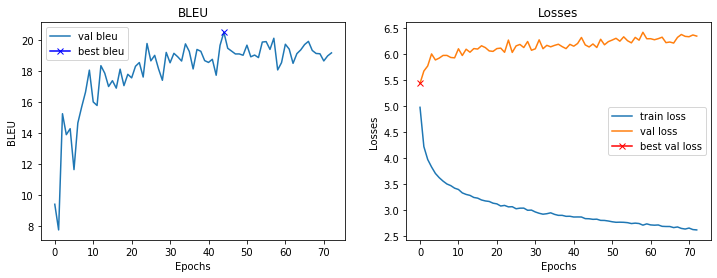

Epoch : 22200
Train example :
	Target: a red uniformed football player tackles an opposing player .
	Output: two football football football player in the opponent player .
Random example:
	Target: four people outside , three of whom are seated males .
	Output: a man and a woman are sitting outside on a patio .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two people are playing in a water fountain .
Train loss    : 2.6218897859255472
Val loss      : 6.3383771777153015
Val bleu      : 19.48082090023908



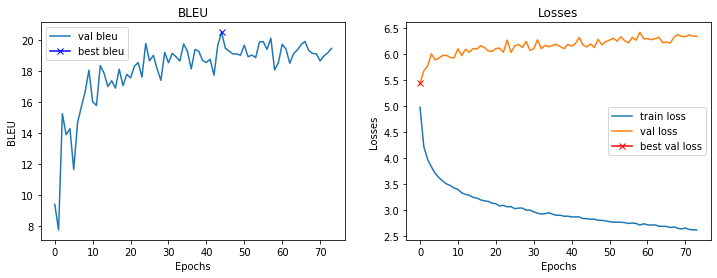

Epoch : 22500
Train example :
	Target: a red-haired clown cries streams of tears in a white hat on stage .
	Output: a man woman with on in a . a band shirt . a stage
Random example:
	Target: old woman in headscarf and glasses stands outside in a big city .
	Output: a man in a red jacket is a red hat on his head .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man is sitting on a roof with a bucket of water .
Train loss    : 2.6205543526013693
Val loss      : 6.340820670127869
Val bleu      : 18.548936382170005



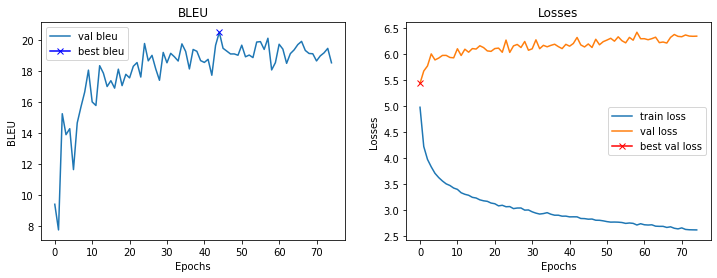

Epoch : 22800
Train example :
	Target: the two dogs are running on the grass .
	Output: two brown dogs are playing through the grass .
Random example:
	Target: asian mom holding tiny infant .
	Output: a young boy in a red shirt is holding a baby .
Fixed example :
	Target: a group of children learning to swim .
	Output: two people are playing a game of water .
Train loss    : 2.6332481129964194
Val loss      : 6.317724734544754
Val bleu      : 19.62475712218946



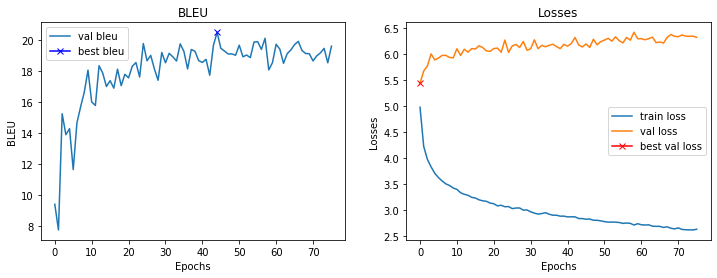

Epoch : 23100
Train example :
	Target: a group of friends stand in front of art they have sprayed for a picture .
	Output: a group of people standing in front of a UNK are UNK of art . .
Random example:
	Target: a person on a motorcycle going uphill on rocky terrain
	Output: a man in a red and black uniform is riding a red bike .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is on a deck of water while a man watches .
Train loss    : 2.6213560287157693
Val loss      : 6.340125501155853
Val bleu      : 18.93734732702246



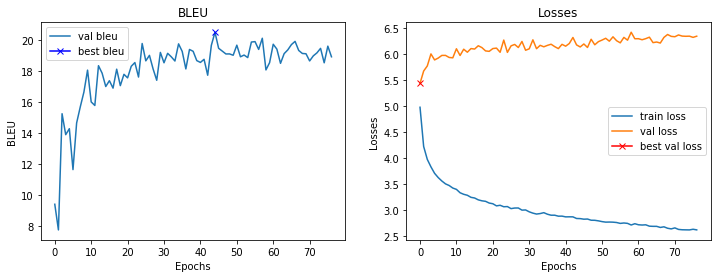

Epoch : 23400
Train example :
	Target: a blond woman with a white tank top and white pants is holding a UNK while standing in a lobby with doors behind her .
	Output: a woman woman in a ponytail tank top and a gray is standing a large of standing in front of . a . her .
Random example:
	Target: three dogs run through a manicured lawn .
	Output: a dog jumps over a red and white dog .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man in a red shirt is cleaning a water .
Train loss    : 2.625328923066457
Val loss      : 6.323658987879753
Val bleu      : 19.43350146333395



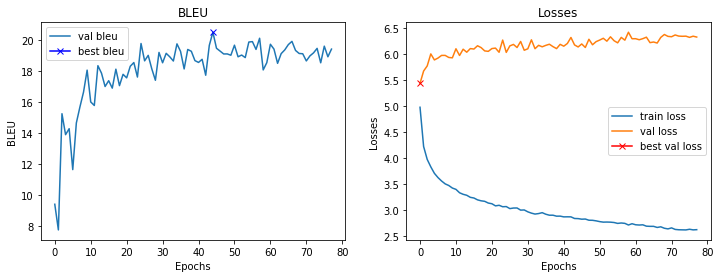

Epoch : 23700
Train example :
	Target: a woman outside of the subway giving directions .
	Output: a man in a pink phone while a to
Random example:
	Target: a man holding the collar of a young rottweiler .
	Output: a black and brown dog is running on a beach .
Fixed example :
	Target: a group of children learning to swim .
	Output: two people are standing on a platform in a pool .
Train loss    : 2.5745376046498616
Val loss      : 6.403439953923225
Val bleu      : 19.493747799742977



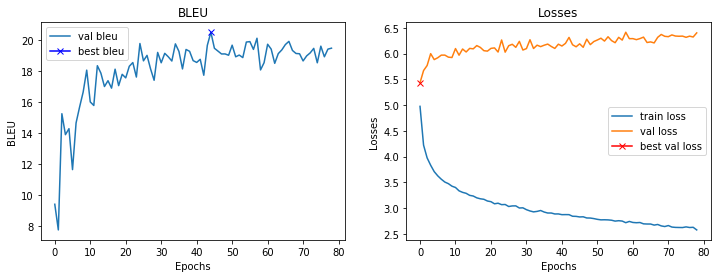

Epoch : 24000
Train example :
	Target: a man and woman wait outside the entrance railing of a subway station outside of a UNK italian restaurant .
	Output: a man and a are to a subway of of a train . . .
Random example:
	Target: one woman in UNK veil and dress is laughing and conversing with another woman in a white veil and light green dress .
	Output: a woman in a red shirt is holding a plate of food .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: two people are playing a game of water .
Train loss    : 2.5916139753659566
Val loss      : 6.405967995524406
Val bleu      : 18.988367283074766



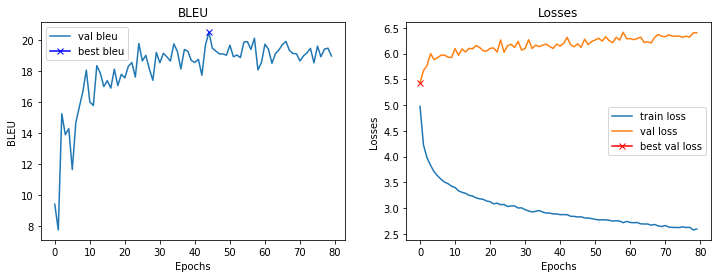

Epoch : 24300
Train example :
	Target: a man stands on a boardwalk with a camera in his hands as a woman in white looks through a telescope over the water towards a large rock outcropping next to a town .
	Output: a couple and on a bridge by a bridge in the hand . he woman in a is on . railing . the water . the body of . . to a body of
Random example:
	Target: a boy wearing a blue shirt is touching the trunk of a tree with his finger .
	Output: a boy in a blue shirt is climbing a tree .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two men are playing a game of water .
Train loss    : 2.5933652035395305
Val loss      : 6.372784852981567
Val bleu      : 18.744413618144815



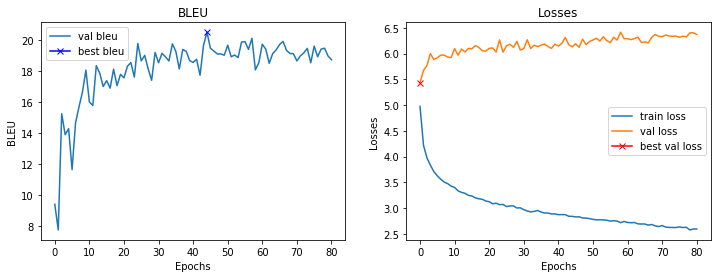

Epoch : 24600
Train example :
	Target: a brown dog is about to catch a treat .
	Output: a brown dog is jumping to catch a ball .
Random example:
	Target: a dog licking its lips while snowfalls .
	Output: a brown and white dog is jumping over a white and white dog .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man is cleaning a large blue water .
Train loss    : 2.6042930833498636
Val loss      : 6.316382020711899
Val bleu      : 19.379904050211323



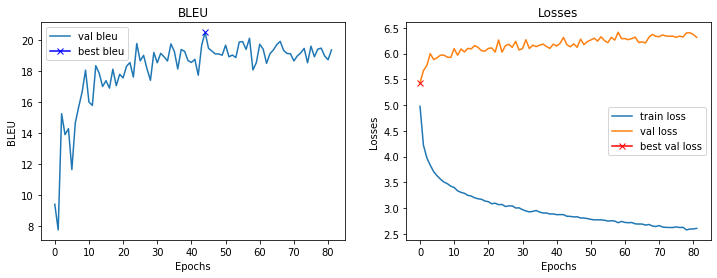

Epoch : 24900
Train example :
	Target: red wall filled with graffiti .
	Output: a man with with graffiti on
Random example:
	Target: the man on the ground in the blue , white , and red jacket is going something to the bike while the other man standing up in the red , white , and blue outfit holds it up .
	Output: a group of people are riding bikes in a race .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man in a black shirt is standing on a roof with a ball in his hand .
Train loss    : 2.57918527841568
Val loss      : 6.392641469836235
Val bleu      : 19.325657997926335



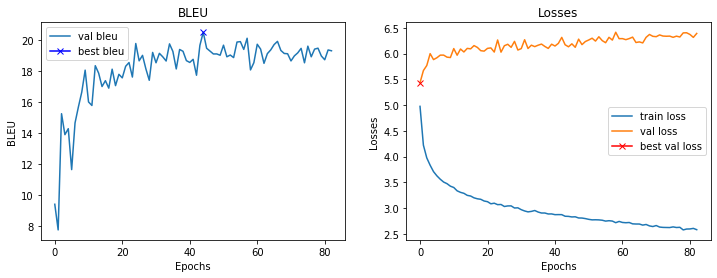

Epoch : 25200
Train example :
	Target: people walking about a university campus with palm trees in the background .
	Output: a are around a UNK campus . a trees in the background .
Random example:
	Target: a person doing a leap with his bike over a hill
	Output: a man is doing a trick on a bicycle .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man in a black shirt is standing on a roof with a bucket in his hand .
Train loss    : 2.5903187521298725
Val loss      : 6.301862955093384
Val bleu      : 18.963074922189964



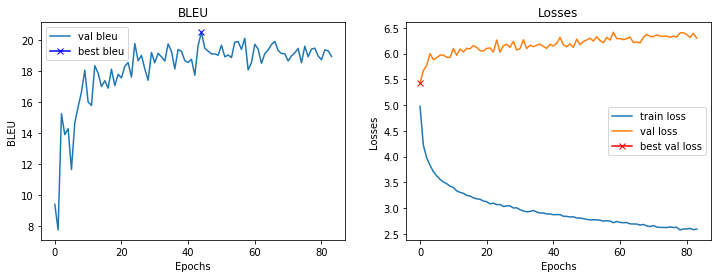

Epoch : 25500
Train example :
	Target: this person is walking down the street and talking on their cellphone on a windy day .
	Output: a is a a down the street , a to the phones . the sunny day .
Random example:
	Target: a family hiking down the hill on a cloudy day .
	Output: a group of people stand on a trail in the middle of a large body of water .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man in a black shirt is sitting on a rug and playing a game .
Train loss    : 2.5653500970204672
Val loss      : 6.399932071566582
Val bleu      : 17.912021121998446



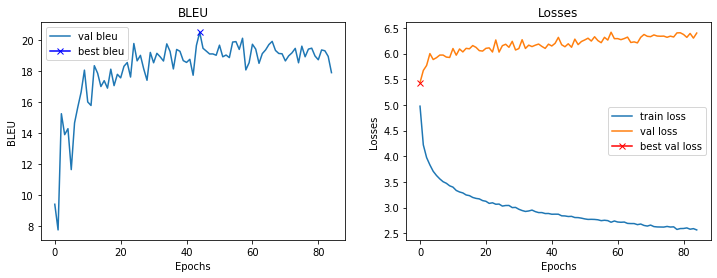

Epoch : 25800
Train example :
	Target: ski equipment sits alone on a snowy mountain
	Output: a equipment are on on a snowy mountain . . . . .
Random example:
	Target: people in UNK going on a boat ride .
	Output: a man in a black and white shirt and white hat is in a small boat in the water .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a black shirt is sitting on a stool and holding a water bottle and a woman in a pink shirt
Train loss    : 2.5588250255584715
Val loss      : 6.428718119859695
Val bleu      : 19.076918545444066



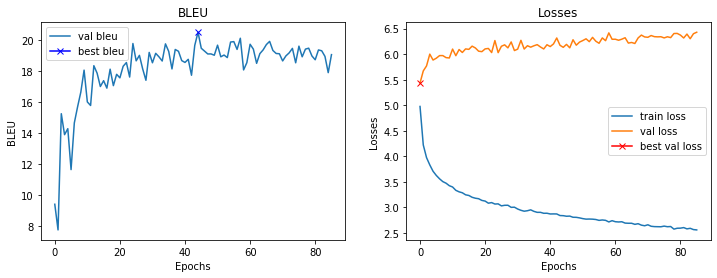

Epoch : 26100
Train example :
	Target: woman in a jacket , walking a small white dog .
	Output: a walking a blue and and on sidewalk red bag .
Random example:
	Target: a young woman wearing white clothing is UNK clothes on a clothesline .
	Output: a young woman wearing a white hat and a blue shirt is holding a hammer .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man and a woman are sitting on a ledge .
Train loss    : 2.576551969051361
Val loss      : 6.3210888504981995
Val bleu      : 18.68119364787646



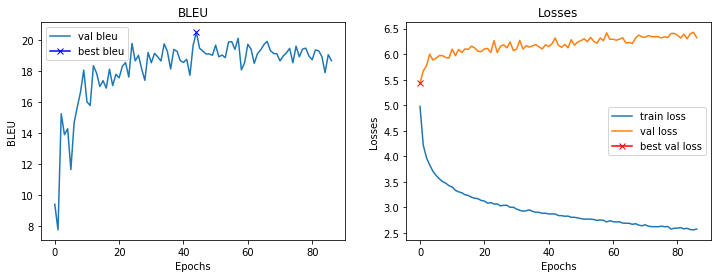

Epoch : 26400
Train example :
	Target: a man plays the bagpipes .
	Output: a man in a hat uniform
Random example:
	Target: a white and brown dog licks his lips during winter .
	Output: a brown and white dog is running through a fence .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a black shirt is a pool in a pool .
Train loss    : 2.539597415924072
Val loss      : 6.449116766452789
Val bleu      : 18.937511117681296



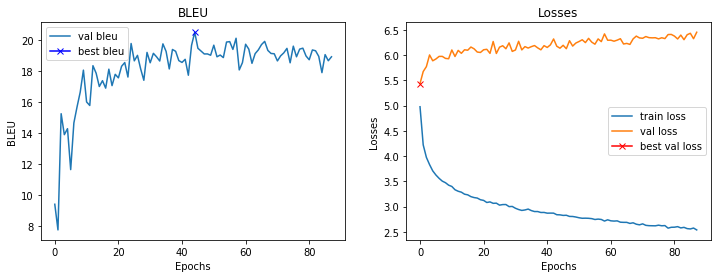

Epoch : 26700
Train example :
	Target: a group of men are gathered in the forest .
	Output: a group of people are standing in a woods .
Random example:
	Target: an older fireman with an orange work suit holding a brown water hose .
	Output: a man in a yellow jacket is sweeping the street .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: two people are in a pool , one is a black shirt and a woman in a black shirt are looking at the water .
Train loss    : 2.5372366404533384
Val loss      : 6.3882831037044525
Val bleu      : 18.49040471597031



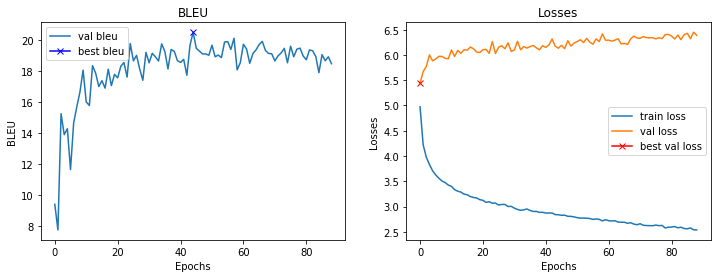

Epoch : 27000
Train example :
	Target: a group of men wait in line to UNK food at a window .
	Output: a man and a are for a to a at a food table .
Random example:
	Target: a small boy does a handstand on one hand .
	Output: a man in a black shirt and black shorts is doing a handstand on a skateboard .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man in a black shirt is standing on a wall with a bucket in his hand .
Train loss    : 2.5316192825635273
Val loss      : 6.4661315232515335
Val bleu      : 18.80395678415625



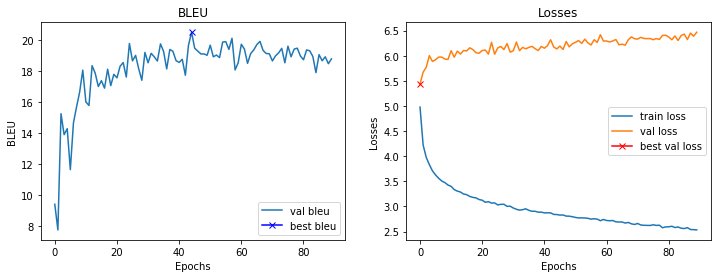

Epoch : 27300
Train example :
	Target: people staring at something in large crowd
	Output: a sitting at a in the crowd . people . . in in in in .
Random example:
	Target: a brown and black dog fetching a blue toy .
	Output: a brown and black dog runs in the dirt .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two people are standing on a dock in a pool .
Train loss    : 2.531020309130351
Val loss      : 6.320133849978447
Val bleu      : 19.293756144391523



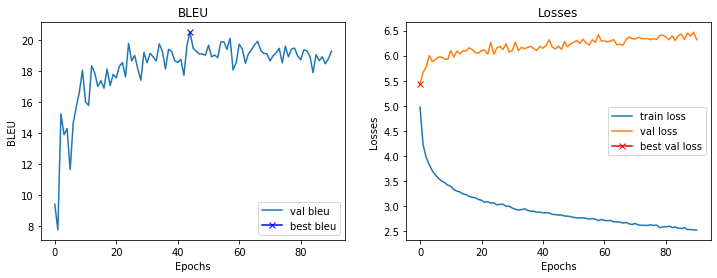

Epoch : 27600
Train example :
	Target: a man practices karate moves in silhouette with a backdrop of a colorful beach sunset .
	Output: a man is a moves in the . a sunset of the beautiful backdrop . .
Random example:
	Target: a construction worker siting on a green tractor .
	Output: a man in a green shirt is working on a tractor .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man in a black shirt is standing on a ladder with a water fountain .
Train loss    : 2.5280123583475747
Val loss      : 6.353628411889076
Val bleu      : 18.44897452985137



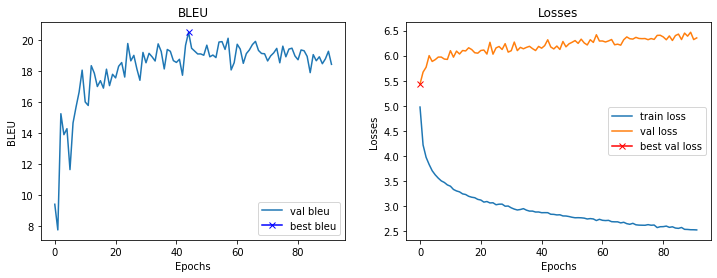

Epoch : 27900
Train example :
	Target: man looks out of second story window .
	Output: a in out of window window window .
Random example:
	Target: a man in a plaid shirt and blue jacket is handing out copies of the " new UNK " .
	Output: a man in a blue jacket is standing in front of a bus .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a group of people are swimming in a pool .
Train loss    : 2.540805960893631
Val loss      : 6.392519488930702
Val bleu      : 19.35346578531825



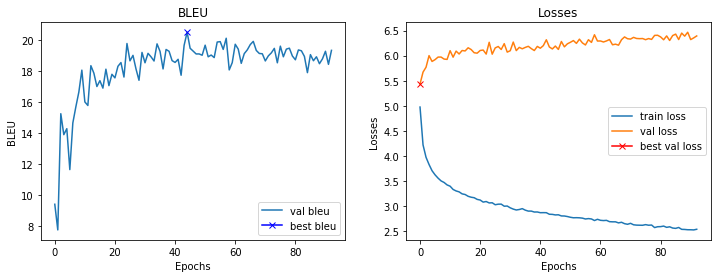

Epoch : 28200
Train example :
	Target: a baseball man playing baseball swings and hits a baseball , while the 4 other men look on .
	Output: a baseball player in baseball . at bat . bat bat while a catcher members watch watch on .
Random example:
	Target: college students enjoy time out of class in a field .
	Output: two young men are sitting on a grass with a small body of water .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a black shirt and a woman in a black shirt are playing a game .
Train loss    : 2.5182929491996764
Val loss      : 6.517825692892075
Val bleu      : 18.35354007188685



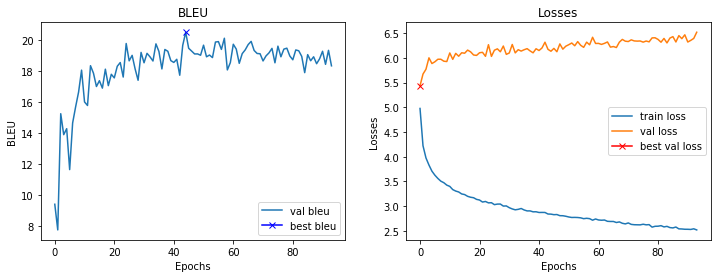

Epoch : 28500
Train example :
	Target: a woman eating food with her hands .
	Output: a woman is in . a hand .
Random example:
	Target: a blond girl and brunette girl walking .
	Output: a woman in a black tank top and a black tank top is standing in a black tank top .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: two men are working on a roof .
Train loss    : 2.525311589241028
Val loss      : 6.493609711527824
Val bleu      : 19.20922275208015



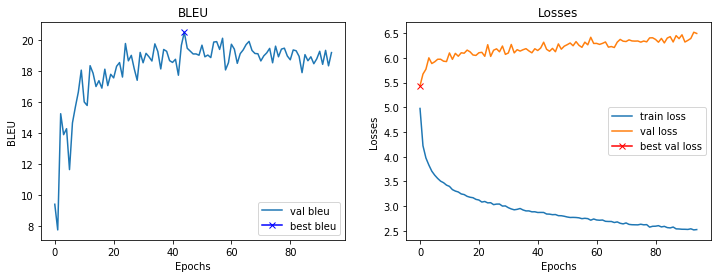

Epoch : 28800
Train example :
	Target: a person on a bike get airborne .
	Output: a man is doing bicycle trick in in
Random example:
	Target: a man in an orange jacket is snowboarding .
	Output: a snowboarder flies through the air .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: two people are sitting on a ledge with a water fountain .
Train loss    : 2.4828380052248638
Val loss      : 6.4178061336278915
Val bleu      : 18.40462971896807



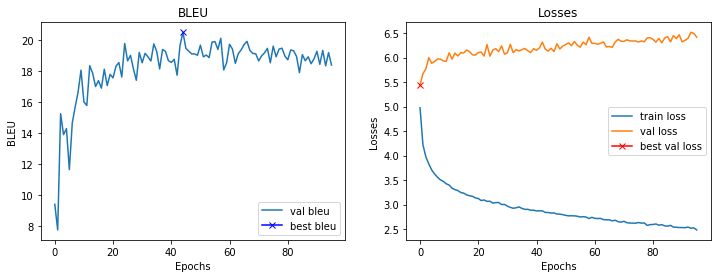

Epoch : 29100
Train example :
	Target: musicians dressed in red and white shirts and khaki pants , performing at a sports arena .
	Output: a are in black and white uniforms are playing pants . are in a basketball arena .
Random example:
	Target: two ladies are walking across the street laughing .
	Output: a man in a red shirt and a woman in a red shirt are walking down the street .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a group of people are playing in a pool .
Train loss    : 2.5205125455061594
Val loss      : 6.429036468267441
Val bleu      : 19.103683764713615



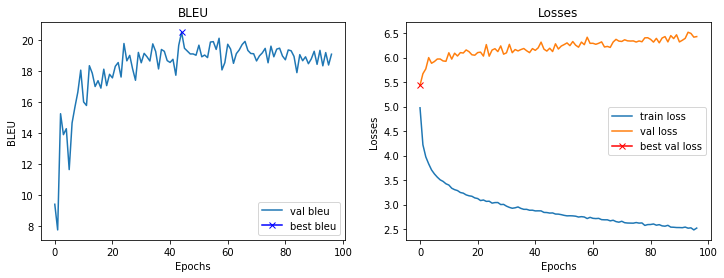

Epoch : 29400
Train example :
	Target: two toddlers , in a stroller , are placed in front of a firetruck .
	Output: a men are sitting a red car white sitting on a of a firetruck .
Random example:
	Target: this is a group of women playing volleyball in sports bikinis .
	Output: a female volleyball player is wearing a red and white suit , is playing volleyball .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man in a white shirt is trying to get a ball into a pool .
Train loss    : 2.5180871427059173
Val loss      : 6.442390248179436
Val bleu      : 18.96238749262368



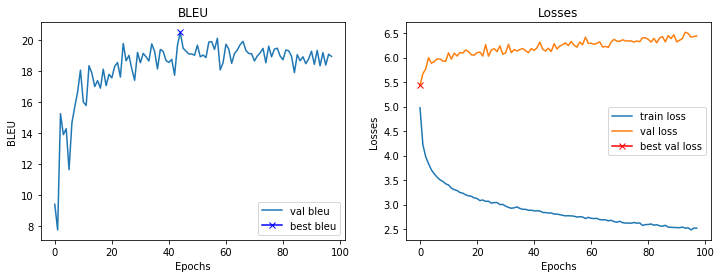

Epoch : 29700
Train example :
	Target: the black dog is walking along a tree trunk bridge over water .
	Output: a dog dog is walking through a river . in . a .
Random example:
	Target: an older woman and a young man play UNK .
	Output: a man in a white shirt and a man in a white shirt are sitting at a table with a red tablecloth .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man in a black shirt is throwing a ball in the pool .
Train loss    : 2.5183912674585978
Val loss      : 6.489129111170769
Val bleu      : 18.70926537649435



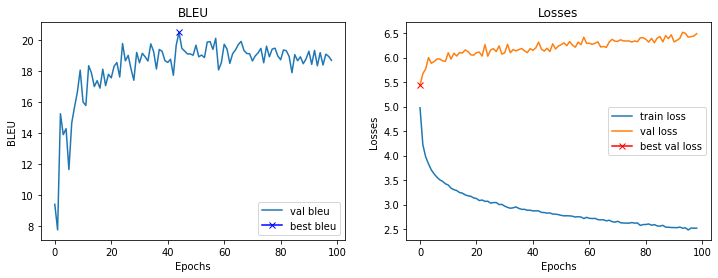

Epoch : 30000
Train example :
	Target: musical band in red light getting ready to perform .
	Output: a band performs a shirt clothing ready to perform .
Random example:
	Target: a woman lays her head down on a pillow on a shelf in a store .
	Output: a woman is laying on a bed with her head .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a black shirt and a woman in a black shirt are looking at a water fountain .
Train loss    : 2.4949400436878206
Val loss      : 6.354687497019768
Val bleu      : 19.16939421631506



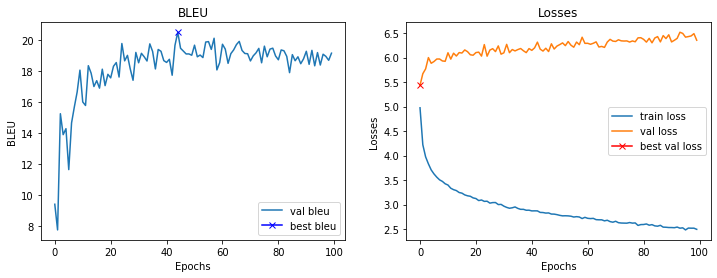

CPU times: user 5h 55min 50s, sys: 1h 6min 13s, total: 7h 2min 3s
Wall time: 6h 21min 31s


In [0]:
%%time
best_bleu = 0
epoch_loss = 0
train_losses = []
val_losses = []
bleu = []
tf = 0.9

for epoch in range(1, max_epochs+1):

  image_vectors, captions_ix = generate_batch(train_dataset, batch_size)
  image_vectors, captions_ix = image_vectors.to(device), captions_ix.to(device)

  captions_ix_next = captions_ix[:, 1:].contiguous()

  network.train()
  network.encoder.eval()

  optimizer.zero_grad()
        
  outputs, atts = network(image_vectors, captions_ix, teacher_forcing_ratio=tf)
          
  loss = criterion(outputs.contiguous().view(-1, outputs.shape[-1]), captions_ix_next.view(-1))
        
  loss.backward()
        
  torch.nn.utils.clip_grad_norm_(network.parameters(), clip)
        
  optimizer.step()
        
  epoch_loss += loss.item()

  if epoch % every_epochs == 0:
    print('Epoch : {}'.format(epoch))
    print('Train example :')
    print('\tTarget: {}'.format(translate(captions_ix_next[0].tolist())))
    print('\tOutput: {}'.format(translate(outputs.argmax(-1)[0].tolist())))
    val_loss, val_bleu = evaluate(network, criterion)   
    print('Train loss    : {}'.format(epoch_loss / every_epochs))
    print('Val loss      : {}'.format(val_loss))
    print('Val bleu      : {}'.format(val_bleu))
    print()
    train_losses.append(epoch_loss / every_epochs)
    val_losses.append(val_loss)
    bleu.append(val_bleu)
    if val_bleu > best_bleu:
      best_bleu = val_bleu
      torch.save(network.state_dict(), '/content/drive/My Drive/Image Captioning/Flickr30/1/v4_model_best_bleu.pt')
    epoch_loss = 0
    plot_loss()

In [0]:
best_bleu

20.524109108485717

In [0]:
torch.save(network.state_dict(), '/content/drive/My Drive/Image Captioning/Flickr30/1/v4_model_30_epoch.pt')

# Проверим качество полученной модели

In [0]:
import skimage.transform
import matplotlib.cm as cm

In [0]:
# Визуализация attention
def visualize_att(image_path, seq, atts, smooth=True):

    image = Image.open(image_path)
    image = image.resize([8 * 24, 8 * 24], Image.LANCZOS)

    words = seq.split() 

    plt.figure(figsize=(10, np.ceil(len(words) / 5.) * 2))
    for t in range(len(words)):
        if t > 50:
            break
        plt.subplot(np.ceil(len(words) / 5.), 5, t + 1)

        plt.text(0, 1, '%s' % (words[t]), color='black', backgroundcolor='white', fontsize=12)
        plt.imshow(image)
        current_att = atts[t, :].reshape(8, 8)
        if smooth:
            att = skimage.transform.pyramid_expand(current_att, upscale=24, sigma=8)
        else:
            att = skimage.transform.resize(current_att, [8 * 24, 8 * 24])

        plt.imshow(att, alpha=0.75)
        plt.set_cmap(cm.Greys_r)
        plt.axis('off')
    plt.show()

## Модель с весами после последней эпохи

In [0]:
# network.load_state_dict(torch.load('/content/drive/My Drive/Image Captioning/Flickr30/1/v4_model_30_epoch.pt')) 

<All keys matched successfully>

In [0]:
# network.eval()
# network = network.to(device)

2020-02-19 14:01:35 URL:https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg [107928/107928] -> "img.jpg" [1]


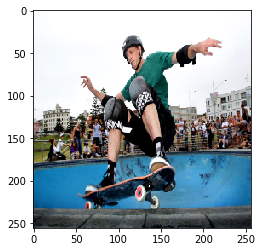

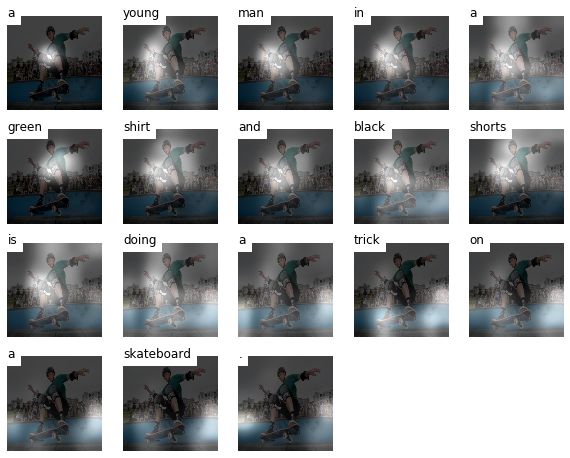

In [0]:
!wget -nv https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) 
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

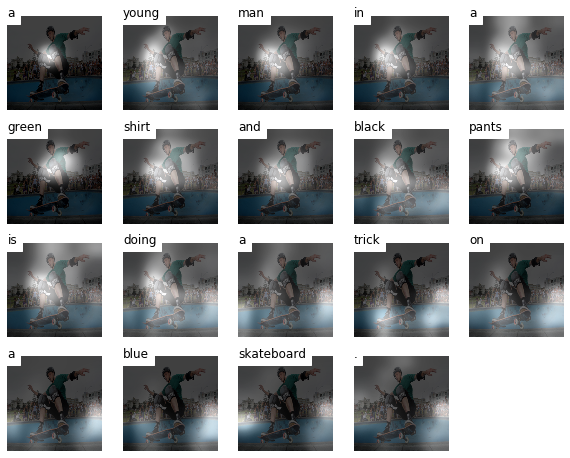

In [0]:
seq, att = network.sample(img, st=3)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-19 14:07:39 URL:https://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg [106870/106870] -> "img.jpg" [1]


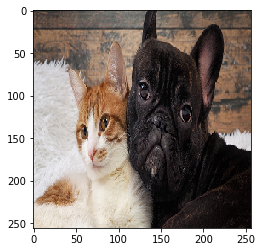

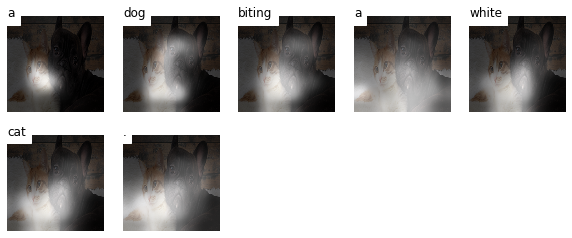

In [0]:
!wget -nv http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

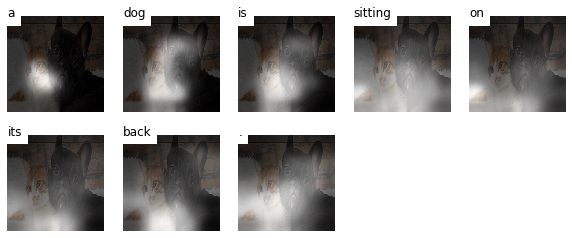

In [0]:
seq, att = network.sample(img, sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-19 14:10:03 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcReseHyoffy4WlXRV7odBq0ZLxmNdgvxlvs4f1mv1ZV5jm7JRC6 [8560/8560] -> "img.jpg" [1]


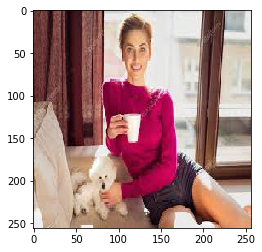

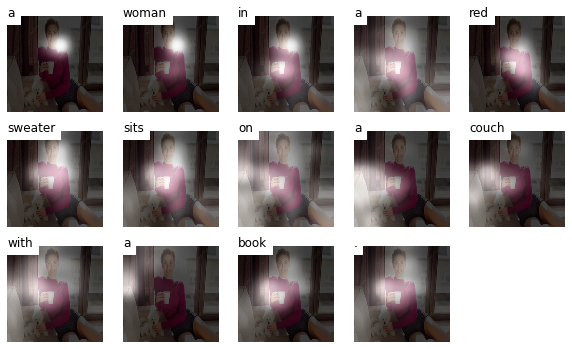

In [0]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcReseHyoffy4WlXRV7odBq0ZLxmNdgvxlvs4f1mv1ZV5jm7JRC6 -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

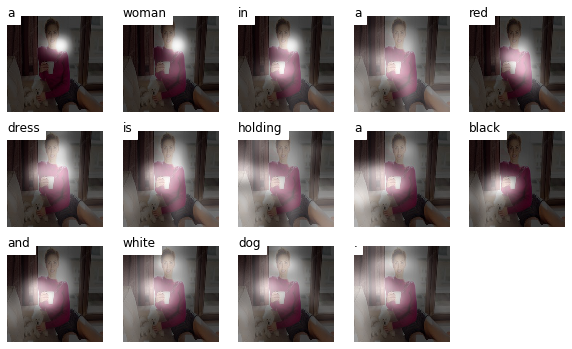

In [0]:
seq, att = network.sample(img, st=2)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-19 14:18:58 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcTsDlSPHluolntOWcD-Fjlvjk4pv-_54p4hajvCg29rnNyY5LFX [8192/8192] -> "img.jpg" [1]


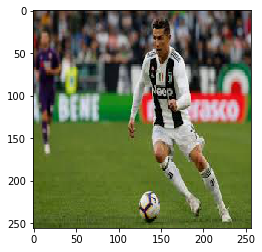

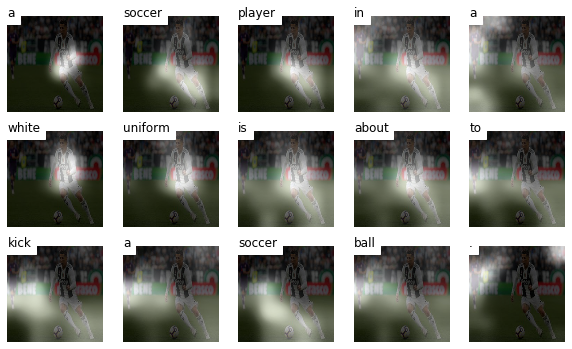

In [0]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcTsDlSPHluolntOWcD-Fjlvjk4pv-_54p4hajvCg29rnNyY5LFX -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

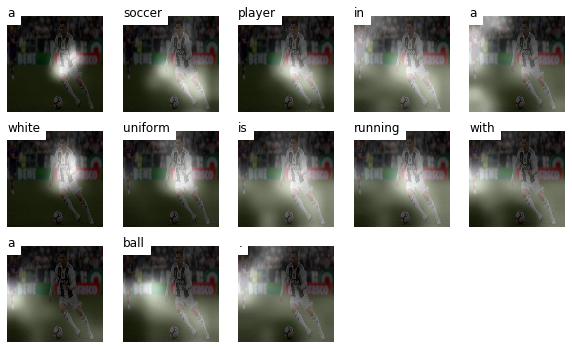

In [0]:
seq, att = network.sample(img, st=3)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-19 14:25:03 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcRLy3gwG_Oz7rVPRnTaWsmCNoI-Lpj86KEQCW1ag02fRwrBMA0Z [5331/5331] -> "img.jpg" [1]


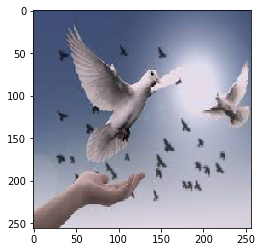

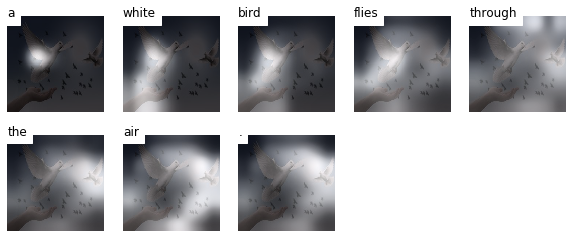

In [0]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcRLy3gwG_Oz7rVPRnTaWsmCNoI-Lpj86KEQCW1ag02fRwrBMA0Z -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img,st=5)
visualize_att('img.jpg', seq, att, smooth=True)

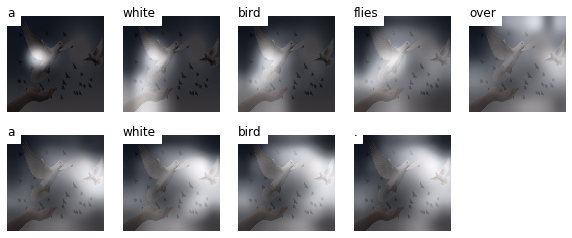

In [0]:
seq, att = network.sample(img,sample=False)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-19 14:26:15 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT50JLrar0jIMcl1A3MeTJiMRj0SBJAflY4l2Qx9hZR1U_tw8jK [9963/9963] -> "img.jpg" [1]


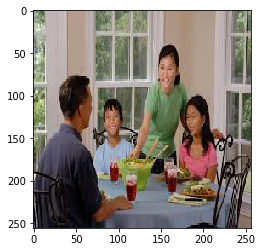

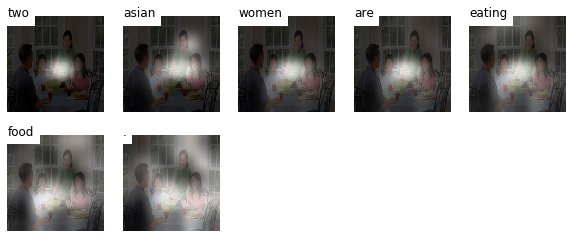

In [0]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT50JLrar0jIMcl1A3MeTJiMRj0SBJAflY4l2Qx9hZR1U_tw8jK -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

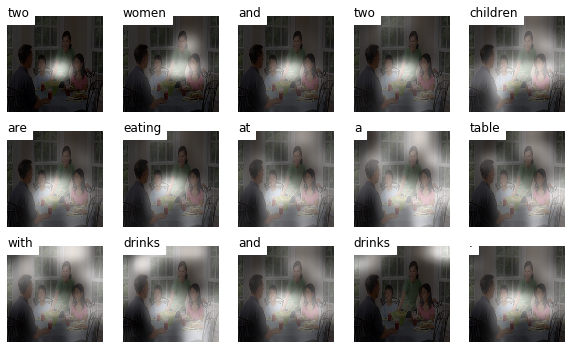

In [0]:
seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

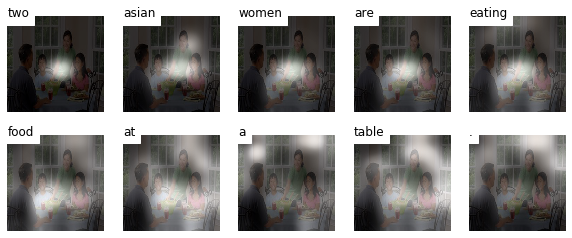

In [0]:
seq, att = network.sample(img, st=3)
visualize_att('img.jpg', seq, att, smooth=True)

## Модель с best BLEU

In [0]:
network.load_state_dict(torch.load('/content/drive/My Drive/Image Captioning/Flickr30/1/v4_model_best_bleu.pt')) 

<All keys matched successfully>

In [0]:
network.eval()
network = network.to(device)

Протестируем сначала на примерах из валидационного датасета:

In [0]:
# Fixed example
num_img = 992

[' swimming instructors teaching young girls how to float in a pool .'
 ' man in black swimsuit plays in pool with three young children .'
 ' two men in wetsuits supervise children as they learn to swim .'
 ' swimming instructors show young girls how to float .'
 ' a group of children learning to swim .']


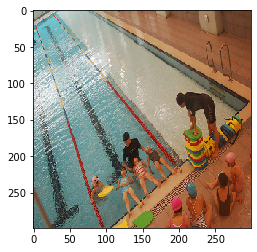

In [0]:
val_dataset.show_sample(num_img)

In [0]:
img, cap = val_dataset[num_img]

In [0]:
image_path = os.path.join(val_dataset.root_dir,
                                val_dataset.data_frame.image_name[num_img])

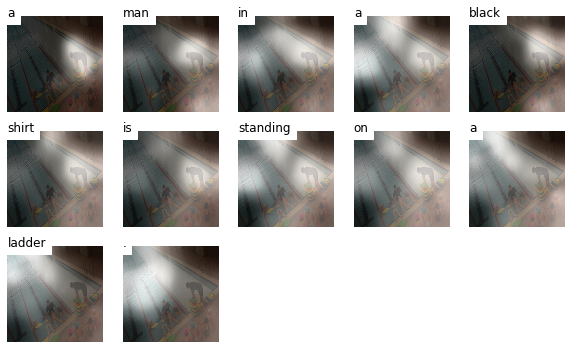

In [0]:
seq, att = network.sample(img.unsqueeze(0).to(device), sample=False)
visualize_att(image_path, seq, att, smooth=True)

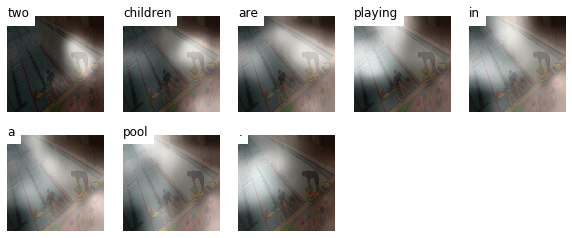

In [0]:
seq, att = network.sample(img.unsqueeze(0).to(device), st=5)
visualize_att(image_path, seq, att, smooth=True)

А теперь несколько случайных примеров:

In [0]:
num_img = random.randint(0, len(val_dataset))

In [0]:
num_img

493

[' a boy wearing sports pajamas sleeps on a large , padded armchair .'
 ' a young boy in his pajamas asleep on a couch .'
 ' a young boy asleep on a couch in his pajamas .'
 ' a young boy in pajamas sleeping on a couch .'
 ' a young boy in pajamas sleeps on a couch .']


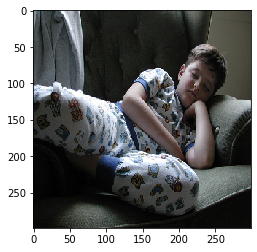

In [0]:
val_dataset.show_sample(num_img)

In [0]:
img, cap = val_dataset[num_img]

In [0]:
image_path = os.path.join(val_dataset.root_dir,
                                val_dataset.data_frame.image_name[num_img])

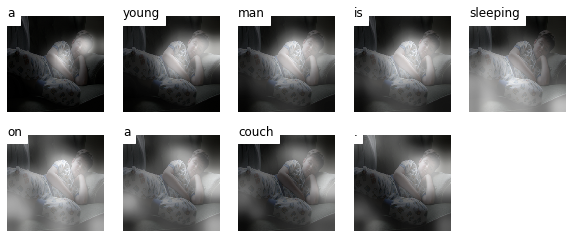

In [0]:
seq, att = network.sample(img.unsqueeze(0).to(device), st=3)
visualize_att(image_path, seq, att, smooth=True)

In [0]:
num_img = random.randint(0, len(val_dataset))

In [0]:
num_img

191

[' an asian woman , wearing a light blur jacket , enjoys a skewer outside .'
 ' this young asian woman munches on some meat on a stick .'
 ' an asian woman is eating some sort of meat on a stick .'
 ' an asian woman is eating food with other people .'
 ' a woman bites into a chicken skewer .']


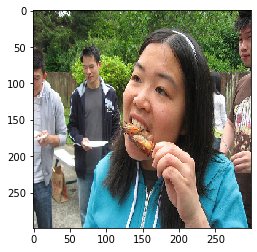

In [0]:
val_dataset.show_sample(num_img)

In [0]:
img, cap = val_dataset[num_img]

In [0]:
image_path = os.path.join(val_dataset.root_dir,
                                val_dataset.data_frame.image_name[num_img])

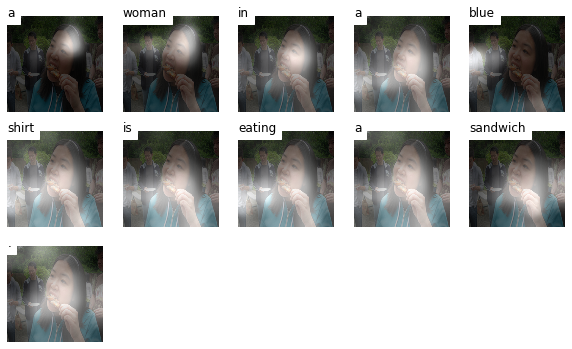

In [0]:
seq, att = network.sample(img.unsqueeze(0).to(device), sample=False)
visualize_att(image_path, seq, att, smooth=True)

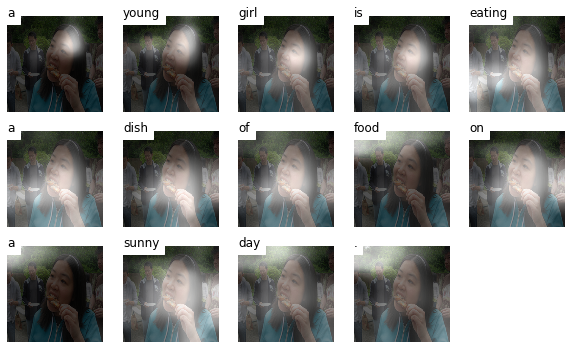

In [0]:
seq, att = network.sample(img.unsqueeze(0).to(device), st=2)
visualize_att(image_path, seq, att, smooth=True)

In [0]:
num_img = random.randint(0, len(val_dataset))

In [0]:
num_img

844

[' young man standing on a dock next to a green and white pole .'
 ' a boy in a red shirt is standing on a dock beside a boat .'
 ' a boy in a red shirt walking down a dock past a boat .'
 ' a beautiful view from the dock overlooking the lake .'
 ' a little boy is standing on a peer next to a boat .']


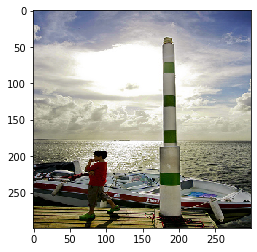

In [0]:
val_dataset.show_sample(num_img)

In [0]:
img, cap = val_dataset[num_img]

In [0]:
image_path = os.path.join(val_dataset.root_dir,
                                val_dataset.data_frame.image_name[num_img])

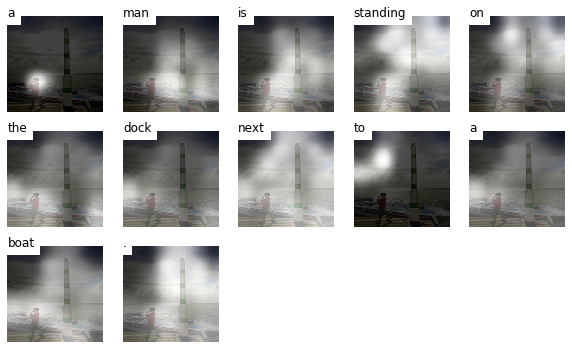

In [0]:
seq, att = network.sample(img.unsqueeze(0).to(device), st=2)
visualize_att(image_path, seq, att, smooth=True)

Теперь скачаем произвольные картинки (не из нашего датасета):

2020-02-19 14:50:26 URL:https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg [107928/107928] -> "img.jpg" [1]


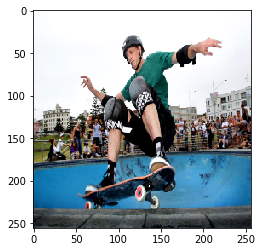

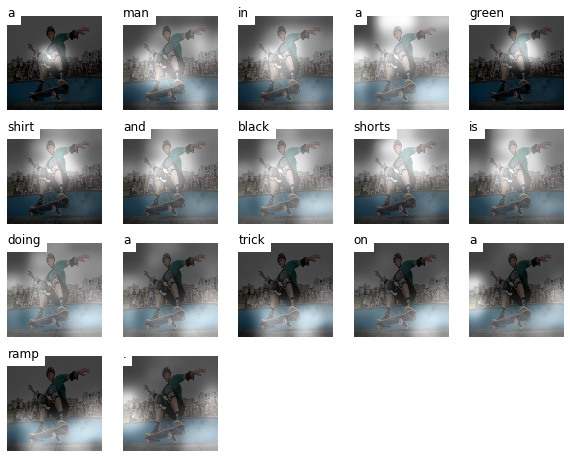

In [0]:
!wget -nv https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

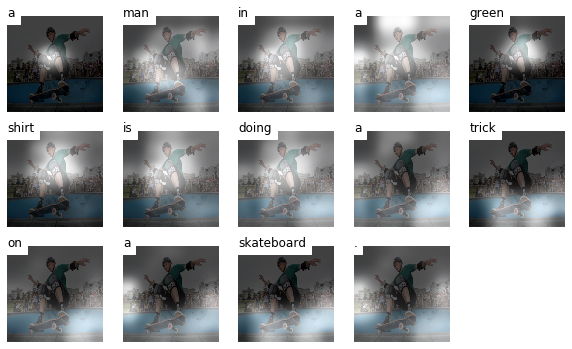

In [0]:
seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-19 14:51:03 URL:https://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg [106870/106870] -> "img.jpg" [1]


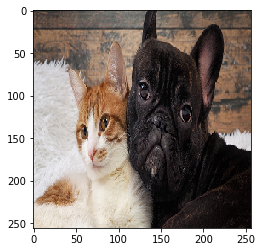

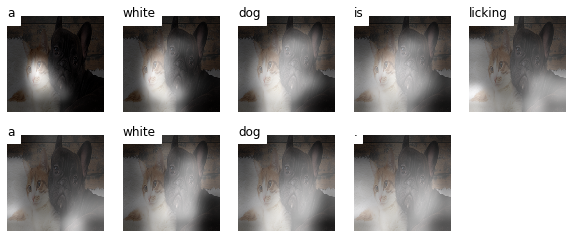

In [0]:
!wget -nv http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

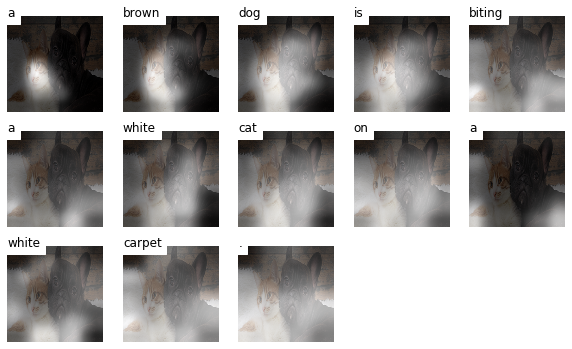

In [0]:
seq, att = network.sample(img, st=2)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-19 15:25:28 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcReseHyoffy4WlXRV7odBq0ZLxmNdgvxlvs4f1mv1ZV5jm7JRC6 [8560/8560] -> "img.jpg" [1]


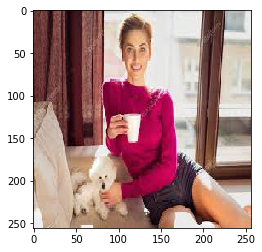

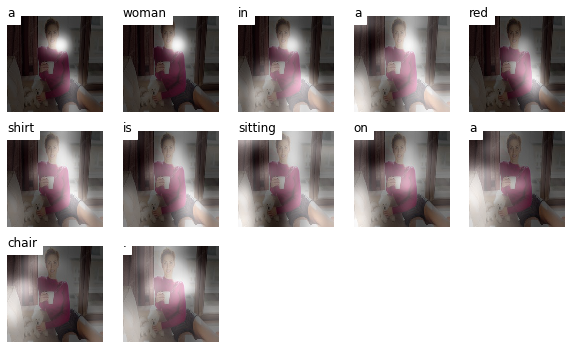

In [0]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcReseHyoffy4WlXRV7odBq0ZLxmNdgvxlvs4f1mv1ZV5jm7JRC6 -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

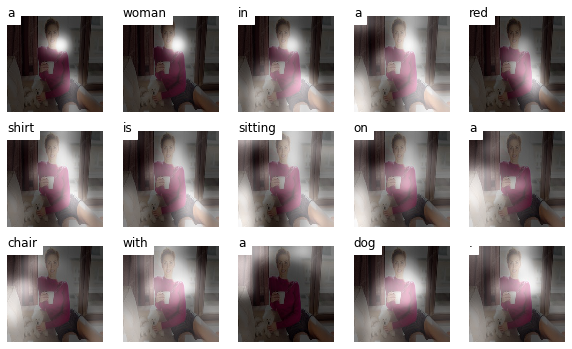

In [0]:
seq, att = network.sample(img, st=3)
visualize_att('img.jpg', seq, att, smooth=True)

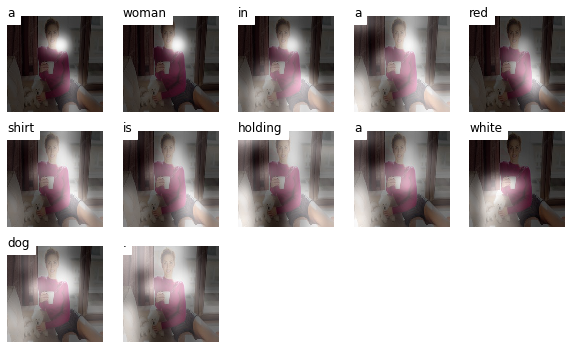

In [0]:
seq, att = network.sample(img, st=3)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-19 15:30:54 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcTsDlSPHluolntOWcD-Fjlvjk4pv-_54p4hajvCg29rnNyY5LFX [8192/8192] -> "img.jpg" [1]


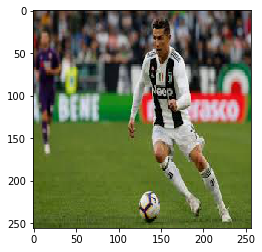

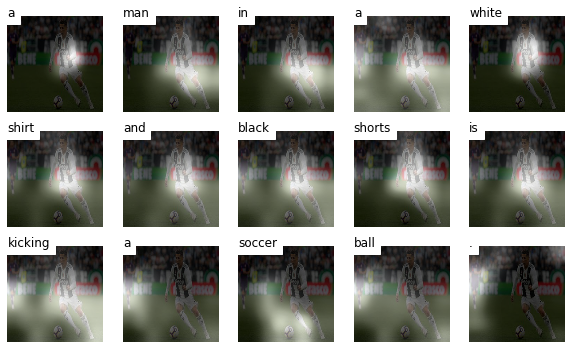

In [0]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcTsDlSPHluolntOWcD-Fjlvjk4pv-_54p4hajvCg29rnNyY5LFX -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

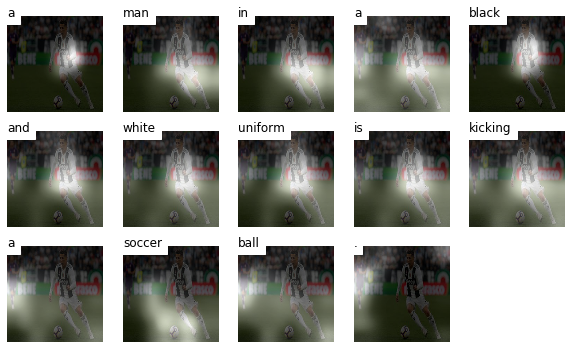

In [0]:
seq, att = network.sample(img, st=3)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-19 15:32:33 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcRLy3gwG_Oz7rVPRnTaWsmCNoI-Lpj86KEQCW1ag02fRwrBMA0Z [5331/5331] -> "img.jpg" [1]


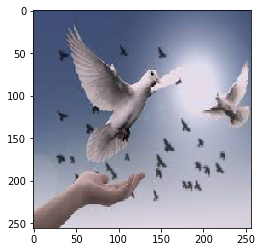

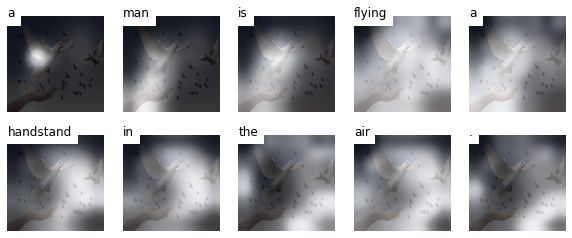

In [0]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcRLy3gwG_Oz7rVPRnTaWsmCNoI-Lpj86KEQCW1ag02fRwrBMA0Z -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

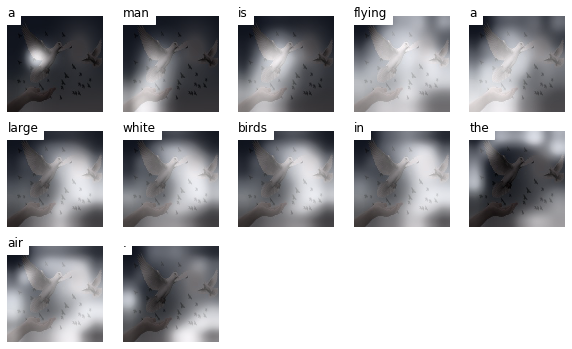

In [0]:
seq, att = network.sample(img, st=2)
visualize_att('img.jpg', seq, att, smooth=True)

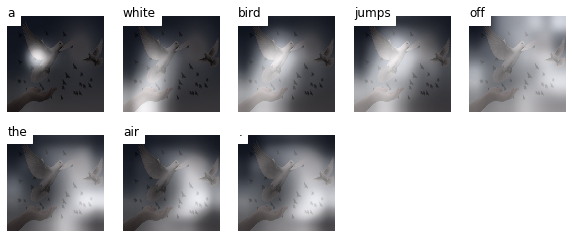

In [0]:
seq, att = network.sample(img, st=2)
visualize_att('img.jpg', seq, att, smooth=True)

2020-02-19 15:43:48 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT50JLrar0jIMcl1A3MeTJiMRj0SBJAflY4l2Qx9hZR1U_tw8jK [9963/9963] -> "img.jpg" [1]


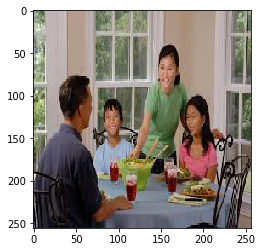

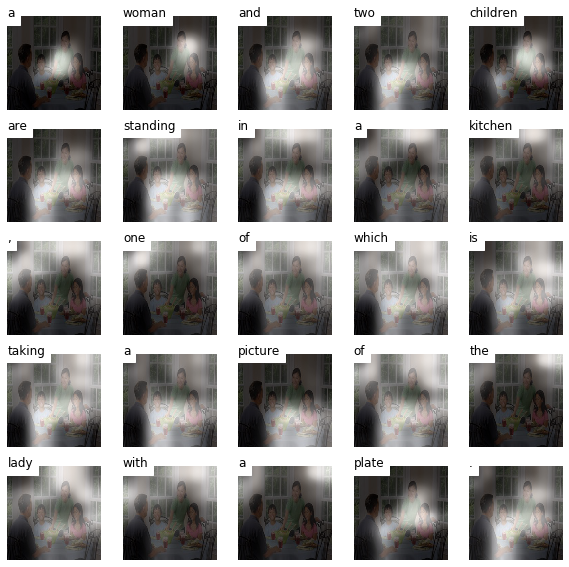

In [0]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT50JLrar0jIMcl1A3MeTJiMRj0SBJAflY4l2Qx9hZR1U_tw8jK -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) #.unsqueeze(0).to(device)
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.sample(img, st=2)
visualize_att('img.jpg', seq, att, smooth=True)

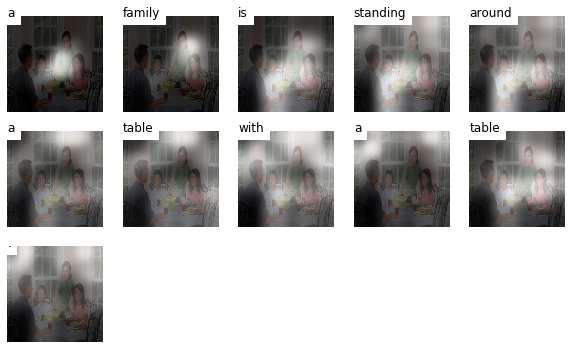

In [0]:
seq, att = network.sample(img, st=3)
visualize_att('img.jpg', seq, att, smooth=True)